In [12]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-

import tweepy
import datetime
import xlsxwriter
import sys
import re
import json
from cucco import Cucco
from nltk import tokenize
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
import matplotlib.pyplot as plt
import numpy as np  
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator



# Se obtienen los tweets de la cuenta especificada durante las fechas indicadas.
# Se guardan los resultados en un archivo JSON con el nombre indicado.
def obtener_tweets(cuenta, archivo, fecha_inicio, fecha_termino):
    # credentials from https://apps.twitter.com/
    consumerKey = "p90Y3lKVA4Zuff3L2nbzMoALG"
    consumerSecret = "c8wBXCTMhQMVSL1yI8CRjKljuk8SC2D2NP5zxBgp0vpO9I8T5j"
    accessToken = "1236482324784693248-iyigvxLB21z3do60tgUVn38B6wHrJs"
    accessTokenSecret = "Tmnl6U2JijocpmskJNRJ4AElvSlhpyJVptRWjqHEfyXGi"

    auth = tweepy.OAuthHandler(consumerKey, consumerSecret)
    auth.set_access_token(accessToken, accessTokenSecret)

    api = tweepy.API(auth)

    username = cuenta
    startDate = datetime.datetime(fecha_inicio[0], fecha_inicio[1], fecha_inicio[2], 0, 0, 0)
    endDate =   datetime.datetime(fecha_termino[0], fecha_termino[1], fecha_termino[2], 0, 0, 0)

    tweets = []
    tmpTweets = api.user_timeline(username)
    for tweet in tmpTweets:
        if tweet.created_at < endDate and tweet.created_at > startDate:
            tweets.append(tweet)

    while (tmpTweets[-1].created_at > startDate):
        print("Ultimo Tweet @", tmpTweets[-1].created_at, " - trayendo mas")
        tmpTweets = api.user_timeline(username, max_id = tmpTweets[-1].id)
        for tweet in tmpTweets:
            if tweet.created_at < endDate and tweet.created_at > startDate:
                tweets.append(tweet)

    tweets_final = []

    for tweet in tweets:
        # Se eliminan menciones y links
        tweet.text = (re.sub(r"(?:\@|https?\://)\S+", "", tweet.text)).strip()
        
        tweet_temp = {}
        if tweet.text != "":
            tweet_temp['id'] = tweet.id
            tweet_temp['created_at'] = str(tweet.created_at)
            tweet_temp['text'] = tweet.text
            
            tweets_final.append(tweet_temp)

    #print(tweets_final)

    with open(archivo, 'w', encoding="utf8") as outfile:
        json.dump(tweets_final, outfile)

    print("Archivo JSON listo. Tweets obtenidos: ", len(tweets_final))
    print("Resultados guardados en: ", archivo)

In [3]:
#Recibe el nombre del archivo que revisará, las fechas entre las que revisará y la lista de tweets a la que
# se agregarán los tweets obtenidos del archivo.

#Devueve la lista de tweets nueva (lista anterior de tweets más los que se agregaron)

def agregar_tweets_desde_archivo_a_lista(archivo, fecha_inicio, fecha_termino, lista = None):
    if lista is None:
        lista = []
    if len(lista) == 0:
        lista = []
    start_date = datetime.datetime(fecha_inicio[0], fecha_inicio[1], fecha_inicio[2],0,0,0)
    end_date = datetime.datetime(fecha_termino[0], fecha_termino[1], fecha_termino[2],23,59,59)
    with open(archivo, 'r', encoding="utf8") as json_file:
        the_json = json.load(json_file)
        
        for tweet in the_json:
            tweet_temp = {}
            created_at_str = tweet["created_at"]
            tweet_created_at = datetime.datetime.strptime(created_at_str, '%Y-%m-%d %H:%M:%S')
            
            
            if start_date < tweet_created_at and tweet_created_at < end_date:
                tweet_temp['id'] = tweet['id']
                tweet_temp['created_at'] = tweet['created_at']
                tweet_temp['text'] = tweet['text']
                
                lista.append(tweet_temp)
        
        print("Tweets agregados. Cantidad de tweets en la lista: ", len(lista))
        return lista
            
         

In [4]:
# Devuelve tweets_text (texto normalizado)
def normalizar_tweets_desde_lista(lista):
    cucco = Cucco()
    tweets_text = ''

    for tweet in lista:
        tweets_text += cucco.normalize(str(tweet['text'])) + ' '
    
    print("Tweets normalizados")
    return tweets_text

In [5]:
# Recibe texto normalizado
# Devuelve las palabras de los tweets
def tokenizar_tweets(texto):
    # Traemos las stopwords en espaniol desde la libreria ntlk
    stop_words = set(stopwords.words("spanish"))
    
    # Tokenizamos el texto
    tokenized_words_tweets = word_tokenize(texto)

    words = [word.lower() for word in tokenized_words_tweets if len(word)>3]
    texto_words_tweets = [word for word in words if word not in stop_words]
    
    print("Tweets tokenizados")
    return texto_words_tweets

In [6]:
# Recibe lista de palabras
# Grafica la distribucion de frecuencia de las palabras
def plot_freq_dist_palabras(lista_palabras, archivo):
    freqDist = FreqDist(lista_palabras)
    print(freqDist)
    freqDist.plot(50)
    
    fig = plt.figure(figsize = (20,10))
    plt.gcf().subplots_adjust(bottom=0.15) # to avoid x-ticks cut-off
    freqDist = FreqDist(lista_palabras)
    freqDist.plot(50)
    fig.savefig(archivo, bbox_inches = "tight")

In [7]:
# Recibe una lista de palabras
# Realiza un Word Cloud con las palabras ingresadas
def wordcloud_tweets(lista_palabras, archivo):
    %matplotlib inline
    plt.rcParams['figure.figsize'] = [20, 10]
    
    wordcloud_tweets = WordCloud(max_font_size=30, max_words=150, background_color="white").generate(str(lista_palabras).replace("'",""))
    plt.imshow(wordcloud_tweets, interpolation='bilinear')
    plt.axis("off")
    fig1 = plt.gcf()
    plt.show()
    fig1.savefig(archivo)

In [47]:
lista_col_derecha_durante = []
lista_col_derecha_durante = agregar_tweets_desde_archivo_a_lista("ALVAROHPRADA.json", (2019,9,21), (2019,10,21), lista_col_derecha_durante)
lista_col_derecha_durante = agregar_tweets_desde_archivo_a_lista("EDR_CD.json", (2019,9,21), (2019,10,21), lista_col_derecha_durante)
lista_col_derecha_durante = agregar_tweets_desde_archivo_a_lista("jenniferariasf.json", (2019,9,21), (2019,10,21), lista_col_derecha_durante)
lista_col_derecha_durante = agregar_tweets_desde_archivo_a_lista("marthavillalbah.json", (2019,9,21), (2019,10,21), lista_col_derecha_durante)
lista_col_derecha_durante = agregar_tweets_desde_archivo_a_lista("aurelioIragorri.json", (2019,9,21), (2019,10,21), lista_col_derecha_durante)
lista_col_derecha_durante = agregar_tweets_desde_archivo_a_lista("GermanBlancoA.json", (2019,9,21), (2019,10,21), lista_col_derecha_durante)
lista_col_derecha_durante = agregar_tweets_desde_archivo_a_lista("NidiaMarcelaO.json", (2019,9,21), (2019,10,21), lista_col_derecha_durante)
tweets_normalizados = normalizar_tweets_desde_lista(lista_col_derecha_durante)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

Tweets agregados. Cantidad de tweets en la lista:  129
Tweets agregados. Cantidad de tweets en la lista:  363
Tweets agregados. Cantidad de tweets en la lista:  473
Tweets agregados. Cantidad de tweets en la lista:  612
Tweets agregados. Cantidad de tweets en la lista:  636
Tweets agregados. Cantidad de tweets en la lista:  762
Tweets agregados. Cantidad de tweets en la lista:  805
Tweets normalizados
Tweets tokenizados


In [52]:
lista_col_derecha_despues = []
lista_col_derecha_despues = agregar_tweets_desde_archivo_a_lista("ALVAROHPRADA.json", (2019,10,21), (2020,1,21), lista_col_derecha_despues)
lista_col_derecha_despues = agregar_tweets_desde_archivo_a_lista("EDR_CD.json", (2019,9,21), (2020,1,21), lista_col_derecha_despues)
lista_col_derecha_despues = agregar_tweets_desde_archivo_a_lista("jenniferariasf.json", (2019,9,21), (2020,1,21), lista_col_derecha_despues)
lista_col_derecha_despues = agregar_tweets_desde_archivo_a_lista("marthavillalbah.json", (2019,9,21), (2020,1,21), lista_col_derecha_despues)
lista_col_derecha_despues = agregar_tweets_desde_archivo_a_lista("aurelioIragorri.json", (2019,9,21), (2020,1,21), lista_col_derecha_despues)
lista_col_derecha_despues = agregar_tweets_desde_archivo_a_lista("GermanBlancoA.json", (2019,9,21), (2020,1,21), lista_col_derecha_despues)
lista_col_derecha_despues = agregar_tweets_desde_archivo_a_lista("NidiaMarcelaO.json", (2019,9,21), (2020,1,21), lista_col_derecha_despues)
tweets_normalizados = normalizar_tweets_desde_lista(lista_col_derecha_despues)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

Tweets agregados. Cantidad de tweets en la lista:  621
Tweets agregados. Cantidad de tweets en la lista:  2048
Tweets agregados. Cantidad de tweets en la lista:  2762
Tweets agregados. Cantidad de tweets en la lista:  3138
Tweets agregados. Cantidad de tweets en la lista:  3260
Tweets agregados. Cantidad de tweets en la lista:  3618
Tweets agregados. Cantidad de tweets en la lista:  3698
Tweets normalizados
Tweets tokenizados


In [37]:
plt.savefig('wordcloud_col_derecha_despues.png')

In [55]:
obtener_tweets("AlbanFarc", "AlbanFarc.json", (2019,9,1), (2020,2,1))
obtener_tweets("angelamrobledo", "angelamrobledo.json", (2019,9,1), (2020,2,1))
obtener_tweets("cjbonillasoto", "cjbonillasoto.json", (2019,9,1), (2020,2,1))
obtener_tweets("GNavasTalero", "GNavasTalero.json", (2019,9,1), (2020,2,1))
obtener_tweets("JorGomezCamara", "JorGomezCamara.json", (2019,9,1), (2020,2,1))

Last Tweet @ 2020-03-02 14:13:06  - fetching some more
Last Tweet @ 2020-02-26 15:15:44  - fetching some more
Last Tweet @ 2020-02-22 12:26:19  - fetching some more
Last Tweet @ 2020-02-19 16:26:27  - fetching some more
Last Tweet @ 2020-02-11 19:06:39  - fetching some more
Last Tweet @ 2020-02-04 15:31:36  - fetching some more
Last Tweet @ 2020-01-29 02:03:20  - fetching some more
Last Tweet @ 2020-01-20 22:19:19  - fetching some more
Last Tweet @ 2020-01-10 16:46:18  - fetching some more
Last Tweet @ 2019-12-26 21:56:46  - fetching some more
Last Tweet @ 2019-12-16 17:59:05  - fetching some more
Last Tweet @ 2019-12-10 01:06:38  - fetching some more
Last Tweet @ 2019-12-02 21:05:28  - fetching some more
Last Tweet @ 2019-11-27 16:40:58  - fetching some more
Last Tweet @ 2019-11-22 00:52:28  - fetching some more
Last Tweet @ 2019-11-15 11:24:09  - fetching some more
Last Tweet @ 2019-11-09 14:26:25  - fetching some more
Last Tweet @ 2019-11-05 21:15:38  - fetching some more
Last Tweet

Last Tweet @ 2020-02-29 15:17:45  - fetching some more
Last Tweet @ 2020-02-29 15:05:23  - fetching some more
Last Tweet @ 2020-02-27 22:17:21  - fetching some more
Last Tweet @ 2020-02-27 22:03:35  - fetching some more
Last Tweet @ 2020-02-27 19:25:16  - fetching some more
Last Tweet @ 2020-02-27 14:04:44  - fetching some more
Last Tweet @ 2020-02-27 13:33:20  - fetching some more
Last Tweet @ 2020-02-26 23:55:33  - fetching some more
Last Tweet @ 2020-02-26 04:14:48  - fetching some more
Last Tweet @ 2020-02-26 02:43:13  - fetching some more
Last Tweet @ 2020-02-26 01:35:07  - fetching some more
Last Tweet @ 2020-02-25 22:11:02  - fetching some more
Last Tweet @ 2020-02-25 02:06:07  - fetching some more
Last Tweet @ 2020-02-25 00:33:56  - fetching some more
Last Tweet @ 2020-02-25 00:19:24  - fetching some more
Last Tweet @ 2020-02-25 00:08:02  - fetching some more
Last Tweet @ 2020-02-24 22:45:24  - fetching some more
Last Tweet @ 2020-02-24 21:10:35  - fetching some more
Last Tweet

Last Tweet @ 2020-01-29 21:59:10  - fetching some more
Last Tweet @ 2020-01-29 21:59:10  - fetching some more
Last Tweet @ 2020-01-29 21:59:10  - fetching some more
Last Tweet @ 2020-01-29 21:59:10  - fetching some more
Last Tweet @ 2020-01-29 21:59:10  - fetching some more
Last Tweet @ 2020-01-29 21:59:10  - fetching some more
Last Tweet @ 2020-01-29 21:59:10  - fetching some more
Last Tweet @ 2020-01-29 21:59:10  - fetching some more
Last Tweet @ 2020-01-29 21:59:10  - fetching some more
Last Tweet @ 2020-01-29 21:59:10  - fetching some more
Last Tweet @ 2020-01-29 21:59:10  - fetching some more
Last Tweet @ 2020-01-29 21:59:10  - fetching some more
Last Tweet @ 2020-01-29 21:59:10  - fetching some more
Last Tweet @ 2020-01-29 21:59:10  - fetching some more
Last Tweet @ 2020-01-29 21:59:10  - fetching some more
Last Tweet @ 2020-01-29 21:59:10  - fetching some more
Last Tweet @ 2020-01-29 21:59:10  - fetching some more
Last Tweet @ 2020-01-29 21:59:10  - fetching some more
Last Tweet

IndexError: list index out of range

In [56]:
obtener_tweets("JorGomezCamara", "JorGomezCamara.json", (2019,9,1), (2020,2,1))

Last Tweet @ 2020-03-04 22:21:32  - fetching some more
Last Tweet @ 2020-02-29 18:47:29  - fetching some more
Last Tweet @ 2020-02-27 15:01:13  - fetching some more
Last Tweet @ 2020-02-24 18:47:04  - fetching some more
Last Tweet @ 2020-02-18 14:21:49  - fetching some more
Last Tweet @ 2020-02-14 23:35:50  - fetching some more
Last Tweet @ 2020-02-11 22:37:03  - fetching some more
Last Tweet @ 2020-02-06 01:51:40  - fetching some more
Last Tweet @ 2020-02-03 16:43:15  - fetching some more
Last Tweet @ 2020-01-31 13:51:41  - fetching some more
Last Tweet @ 2020-01-27 14:46:47  - fetching some more
Last Tweet @ 2020-01-20 02:45:02  - fetching some more
Last Tweet @ 2020-01-17 01:30:03  - fetching some more
Last Tweet @ 2020-01-13 12:02:36  - fetching some more
Last Tweet @ 2020-01-06 18:38:21  - fetching some more
Last Tweet @ 2019-12-26 19:13:34  - fetching some more
Last Tweet @ 2019-12-20 04:06:09  - fetching some more
Last Tweet @ 2019-12-18 14:04:29  - fetching some more
Last Tweet

In [57]:
obtener_tweets("HarryGonzalez", "HarryGonzalez.json", (2019,9,1), (2020,2,1))
obtener_tweets("JezBarraza", "JezBarraza.json", (2019,9,1), (2020,2,1))

Last Tweet @ 2020-03-07 20:15:16  - fetching some more
Last Tweet @ 2020-03-06 10:17:19  - fetching some more
Last Tweet @ 2020-03-04 18:37:40  - fetching some more
Last Tweet @ 2020-03-02 06:22:39  - fetching some more
Last Tweet @ 2020-02-27 19:43:12  - fetching some more
Last Tweet @ 2020-02-25 14:39:51  - fetching some more
Last Tweet @ 2020-02-23 01:11:58  - fetching some more
Last Tweet @ 2020-02-17 16:37:37  - fetching some more
Last Tweet @ 2020-02-12 20:02:27  - fetching some more
Last Tweet @ 2020-02-05 19:49:46  - fetching some more
Last Tweet @ 2020-01-28 12:40:30  - fetching some more
Last Tweet @ 2020-01-22 10:06:56  - fetching some more
Last Tweet @ 2020-01-19 00:32:22  - fetching some more
Last Tweet @ 2020-01-13 15:48:47  - fetching some more
Last Tweet @ 2019-12-25 18:40:59  - fetching some more
Last Tweet @ 2019-12-20 06:42:45  - fetching some more
Last Tweet @ 2019-12-16 15:27:26  - fetching some more
Last Tweet @ 2019-12-12 11:49:59  - fetching some more
Last Tweet

In [73]:
#Ecuador Izquierda (Gobiertno)
obtener_tweets("Lenin", "Lenin.json", (2019,9,1), (2020,2,1))
obtener_tweets("PenafielEddy", "PenafielEddy.json", (2019,9,1), (2020,2,1))
obtener_tweets("Fafo_Gavilanez", "Fafo_Gavilanez.json", (2019,9,1), (2020,2,1))
obtener_tweets("EAyalaMora", "EAyalaMora.json", (2019,9,1), (2020,2,1))
obtener_tweets("JaimeLeonH80", "JaimeLeonH80.json", (2019,9,1), (2020,2,1))

obtener_tweets("GabrielaCerdaEc", "GabrielaCerdaEc.json", (2019,9,1), (2020,2,1))
obtener_tweets("EncaDuchi", "EncaDuchi.json", (2019,9,1), (2020,2,1))
obtener_tweets("Wilmandrade", "Wilmandrade.json", (2019,9,1), (2020,2,1))
obtener_tweets("GabrielaEsPais", "GabrielaEsPais.json", (2019,9,1), (2020,2,1))
obtener_tweets("solbuendia", "solbuendia.json", (2019,9,1), (2020,2,1))

Last Tweet @ 2020-02-27 19:45:47  - fetching some more
Last Tweet @ 2020-02-18 16:21:17  - fetching some more
Last Tweet @ 2020-02-08 12:05:23  - fetching some more
Last Tweet @ 2020-01-29 19:30:44  - fetching some more
Last Tweet @ 2020-01-20 21:01:14  - fetching some more
Last Tweet @ 2020-01-10 01:08:29  - fetching some more
Last Tweet @ 2019-12-24 23:35:12  - fetching some more
Last Tweet @ 2019-12-17 15:22:17  - fetching some more
Last Tweet @ 2019-12-13 12:17:13  - fetching some more
Last Tweet @ 2019-12-07 16:35:38  - fetching some more
Last Tweet @ 2019-11-28 03:12:22  - fetching some more
Last Tweet @ 2019-11-21 14:36:09  - fetching some more
Last Tweet @ 2019-11-11 01:00:00  - fetching some more
Last Tweet @ 2019-10-29 20:00:34  - fetching some more
Last Tweet @ 2019-10-18 21:05:18  - fetching some more
Last Tweet @ 2019-10-14 01:55:25  - fetching some more
Last Tweet @ 2019-10-08 04:17:52  - fetching some more
Last Tweet @ 2019-10-02 02:44:32  - fetching some more
Last Tweet

Last Tweet @ 2019-10-26 00:48:47  - fetching some more
Last Tweet @ 2019-10-19 03:30:27  - fetching some more
Last Tweet @ 2019-10-16 16:55:33  - fetching some more
Last Tweet @ 2019-10-09 01:12:48  - fetching some more
Last Tweet @ 2019-10-04 20:38:34  - fetching some more
Last Tweet @ 2019-09-30 01:59:46  - fetching some more
Last Tweet @ 2019-09-19 17:49:09  - fetching some more
Last Tweet @ 2019-09-18 14:58:17  - fetching some more
Last Tweet @ 2019-09-13 17:55:29  - fetching some more
Last Tweet @ 2019-09-09 16:45:30  - fetching some more
Last Tweet @ 2019-09-05 16:00:45  - fetching some more
Last Tweet @ 2019-09-03 20:41:37  - fetching some more
Archivo JSON listo. Tweets obtenidos:  417
Resultados guardados en:  Wilmandrade.json
Last Tweet @ 2020-03-08 18:00:41  - fetching some more
Last Tweet @ 2020-03-06 18:36:13  - fetching some more
Last Tweet @ 2020-03-05 20:24:57  - fetching some more
Last Tweet @ 2020-03-05 02:24:04  - fetching some more
Last Tweet @ 2020-03-03 05:51:45  

Last Tweet @ 2019-10-04 21:15:40  - fetching some more
Last Tweet @ 2019-10-04 16:49:53  - fetching some more
Last Tweet @ 2019-10-04 08:11:16  - fetching some more
Last Tweet @ 2019-10-03 20:28:18  - fetching some more
Last Tweet @ 2019-10-03 16:50:46  - fetching some more
Last Tweet @ 2019-10-02 15:29:50  - fetching some more
Last Tweet @ 2019-10-02 02:17:26  - fetching some more
Last Tweet @ 2019-10-01 04:26:53  - fetching some more
Last Tweet @ 2019-09-30 14:47:53  - fetching some more
Last Tweet @ 2019-09-28 03:27:16  - fetching some more
Last Tweet @ 2019-09-27 15:15:38  - fetching some more
Last Tweet @ 2019-09-27 00:29:05  - fetching some more
Last Tweet @ 2019-09-25 19:01:27  - fetching some more
Last Tweet @ 2019-09-25 00:07:44  - fetching some more
Last Tweet @ 2019-09-23 01:54:12  - fetching some more
Last Tweet @ 2019-09-20 17:11:55  - fetching some more
Last Tweet @ 2019-09-20 02:21:19  - fetching some more
Last Tweet @ 2019-09-18 15:09:45  - fetching some more
Last Tweet

In [74]:
#Ecuador Derecha 
obtener_tweets("Jeanninecruzz", "Jeanninecruzz.json", (2019,9,1), (2020,2,1))
obtener_tweets("RinaCampainB", "RinaCampainB.json", (2019,9,1), (2020,2,1))
obtener_tweets("TanllyVera", "TanllyVera.json", (2019,9,1), (2020,2,1))
obtener_tweets("PaolaVintimilla", "PaolaVintimilla.json", (2019,9,1), (2020,2,1))
obtener_tweets("Gabitegui", "Gabitegui.json", (2019,9,1), (2020,2,1))

obtener_tweets("Fernandcallejas", "Fernandcallejas.json", (2019,9,1), (2020,2,1))
obtener_tweets("hcastanierj", "hcastanierj.json", (2019,9,1), (2020,2,1))
obtener_tweets("raulauquilla21", "raulauquilla21.json", (2019,9,1), (2020,2,1))
obtener_tweets("csolorzano3", "csolorzano3.json", (2019,9,1), (2020,2,1))
obtener_tweets("LassoGuillermo", "LassoGuillermo.json", (2019,9,1), (2020,2,1))

Last Tweet @ 2020-03-07 00:40:53  - fetching some more
Last Tweet @ 2020-03-04 16:11:19  - fetching some more
Last Tweet @ 2020-02-28 17:52:00  - fetching some more
Last Tweet @ 2020-02-27 00:12:20  - fetching some more
Last Tweet @ 2020-02-23 05:26:11  - fetching some more
Last Tweet @ 2020-02-19 18:35:09  - fetching some more
Last Tweet @ 2020-02-16 20:34:03  - fetching some more
Last Tweet @ 2020-02-11 16:08:20  - fetching some more
Last Tweet @ 2020-02-07 18:43:01  - fetching some more
Last Tweet @ 2020-02-04 19:36:59  - fetching some more
Last Tweet @ 2020-02-03 18:38:45  - fetching some more
Last Tweet @ 2020-02-02 18:11:04  - fetching some more
Last Tweet @ 2020-01-31 23:09:59  - fetching some more
Last Tweet @ 2020-01-31 13:02:16  - fetching some more
Last Tweet @ 2020-01-30 00:27:56  - fetching some more
Last Tweet @ 2020-01-26 12:47:00  - fetching some more
Last Tweet @ 2020-01-23 16:38:10  - fetching some more
Last Tweet @ 2020-01-21 19:42:18  - fetching some more
Last Tweet

Last Tweet @ 2019-09-24 14:51:58  - fetching some more
Last Tweet @ 2019-09-15 22:01:28  - fetching some more
Last Tweet @ 2019-09-04 12:31:28  - fetching some more
Archivo JSON listo. Tweets obtenidos:  501
Resultados guardados en:  PaolaVintimilla.json
Last Tweet @ 2020-03-05 17:30:44  - fetching some more
Last Tweet @ 2020-02-22 01:37:39  - fetching some more
Last Tweet @ 2020-02-19 13:24:25  - fetching some more
Last Tweet @ 2020-02-14 12:49:35  - fetching some more
Last Tweet @ 2020-02-10 19:26:58  - fetching some more
Last Tweet @ 2020-02-03 12:50:53  - fetching some more
Last Tweet @ 2020-01-30 02:26:44  - fetching some more
Last Tweet @ 2020-01-23 21:33:49  - fetching some more
Last Tweet @ 2020-01-20 18:58:40  - fetching some more
Last Tweet @ 2020-01-14 23:33:32  - fetching some more
Last Tweet @ 2020-01-09 21:57:05  - fetching some more
Last Tweet @ 2020-01-06 13:36:27  - fetching some more
Last Tweet @ 2019-12-27 22:57:54  - fetching some more
Last Tweet @ 2019-12-19 13:10:

Last Tweet @ 2019-11-25 23:47:39  - fetching some more
Last Tweet @ 2019-11-19 20:58:18  - fetching some more
Last Tweet @ 2019-11-10 21:58:16  - fetching some more
Last Tweet @ 2019-10-26 01:02:29  - fetching some more
Last Tweet @ 2019-10-01 13:58:10  - fetching some more
Last Tweet @ 2019-09-25 12:28:44  - fetching some more
Last Tweet @ 2019-09-15 16:51:41  - fetching some more
Last Tweet @ 2019-09-10 23:02:14  - fetching some more
Last Tweet @ 2019-09-06 01:39:27  - fetching some more
Last Tweet @ 2019-09-04 12:31:48  - fetching some more
Last Tweet @ 2019-09-02 15:49:31  - fetching some more
Archivo JSON listo. Tweets obtenidos:  295
Resultados guardados en:  LassoGuillermo.json


In [75]:
#Ecuador Centro:

obtener_tweets("nathalytoledo", "nathalytoledo.json", (2019,9,1), (2020,2,1))
obtener_tweets("karlasacoto", "karlasacoto.json", (2019,9,1), (2020,2,1))
obtener_tweets("lizvalarezo", "lizvalarezo.json", (2019,9,1), (2020,2,1))
obtener_tweets("VeronicaLoaizaV", "VeronicaLoaizaV.json", (2019,9,1), (2020,2,1))

obtener_tweets("jimmyjairala", "jimmyjairala.json", (2019,9,1), (2020,2,1))
obtener_tweets("_alextortol", "_alextortol.json", (2019,9,1), (2020,2,1))
obtener_tweets("JorgeVelezVelez", "JorgeVelezVelez.json", (2019,9,1), (2020,2,1))
obtener_tweets("jpvelin", "jpvelin.json", (2019,9,1), (2020,2,1))
obtener_tweets("YandunRene", "YandunRene.json", (2019,9,1), (2020,2,1))

Last Tweet @ 2020-02-28 03:23:17  - fetching some more
Last Tweet @ 2020-02-08 16:37:24  - fetching some more
Last Tweet @ 2020-01-13 15:07:39  - fetching some more
Last Tweet @ 2019-12-14 21:14:27  - fetching some more
Last Tweet @ 2019-11-06 15:23:01  - fetching some more
Last Tweet @ 2019-10-18 16:29:34  - fetching some more
Last Tweet @ 2019-09-24 14:05:01  - fetching some more
Archivo JSON listo. Tweets obtenidos:  97
Resultados guardados en:  nathalytoledo.json
Last Tweet @ 2020-02-29 15:50:26  - fetching some more
Last Tweet @ 2020-02-24 15:22:40  - fetching some more
Last Tweet @ 2020-02-17 15:45:52  - fetching some more
Last Tweet @ 2019-12-11 01:16:59  - fetching some more
Last Tweet @ 2019-11-18 18:30:57  - fetching some more
Last Tweet @ 2019-10-23 01:38:50  - fetching some more
Last Tweet @ 2019-10-12 23:22:18  - fetching some more
Last Tweet @ 2019-10-12 22:23:08  - fetching some more
Last Tweet @ 2019-10-12 12:54:16  - fetching some more
Last Tweet @ 2019-10-08 22:45:30 

Last Tweet @ 2019-11-19 17:45:44  - fetching some more
Last Tweet @ 2019-11-18 18:49:52  - fetching some more
Last Tweet @ 2019-11-18 02:31:22  - fetching some more
Last Tweet @ 2019-11-15 16:55:36  - fetching some more
Last Tweet @ 2019-11-14 18:57:35  - fetching some more
Last Tweet @ 2019-11-13 18:01:03  - fetching some more
Last Tweet @ 2019-11-12 18:39:14  - fetching some more
Last Tweet @ 2019-11-11 21:18:22  - fetching some more
Last Tweet @ 2019-11-10 00:53:21  - fetching some more
Last Tweet @ 2019-11-08 17:20:03  - fetching some more
Last Tweet @ 2019-11-07 18:46:22  - fetching some more
Last Tweet @ 2019-11-06 12:29:44  - fetching some more
Last Tweet @ 2019-11-05 18:38:39  - fetching some more
Last Tweet @ 2019-10-31 15:08:46  - fetching some more
Last Tweet @ 2019-10-30 20:44:10  - fetching some more
Last Tweet @ 2019-10-30 15:11:00  - fetching some more
Last Tweet @ 2019-10-29 16:20:16  - fetching some more
Last Tweet @ 2019-10-28 23:42:14  - fetching some more
Last Tweet

Last Tweet @ 2019-12-03 03:44:43  - fetching some more
Last Tweet @ 2019-12-01 22:30:11  - fetching some more
Last Tweet @ 2019-11-30 01:18:33  - fetching some more
Last Tweet @ 2019-11-28 17:38:01  - fetching some more
Last Tweet @ 2019-11-26 03:38:16  - fetching some more
Last Tweet @ 2019-11-25 16:06:15  - fetching some more
Last Tweet @ 2019-11-23 03:01:12  - fetching some more
Last Tweet @ 2019-11-22 21:21:41  - fetching some more
Last Tweet @ 2019-11-21 20:38:34  - fetching some more
Last Tweet @ 2019-11-21 19:30:49  - fetching some more
Last Tweet @ 2019-11-20 21:53:27  - fetching some more
Last Tweet @ 2019-11-20 02:33:26  - fetching some more
Last Tweet @ 2019-11-19 04:40:34  - fetching some more
Last Tweet @ 2019-11-17 13:46:01  - fetching some more
Last Tweet @ 2019-11-16 04:02:04  - fetching some more
Last Tweet @ 2019-11-15 02:20:11  - fetching some more
Last Tweet @ 2019-11-13 20:11:52  - fetching some more
Last Tweet @ 2019-11-12 22:48:25  - fetching some more
Last Tweet

Tweets agregados. Cantidad de tweets en la lista:  88
Tweets agregados. Cantidad de tweets en la lista:  121
Tweets agregados. Cantidad de tweets en la lista:  172
Tweets agregados. Cantidad de tweets en la lista:  284
Tweets agregados. Cantidad de tweets en la lista:  284
Tweets agregados. Cantidad de tweets en la lista:  301
Tweets agregados. Cantidad de tweets en la lista:  338
Tweets agregados. Cantidad de tweets en la lista:  461
Tweets agregados. Cantidad de tweets en la lista:  895
Tweets agregados. Cantidad de tweets en la lista:  1312
Tweets normalizados
Tweets tokenizados
<FreqDist with 4553 samples and 10676 outcomes>


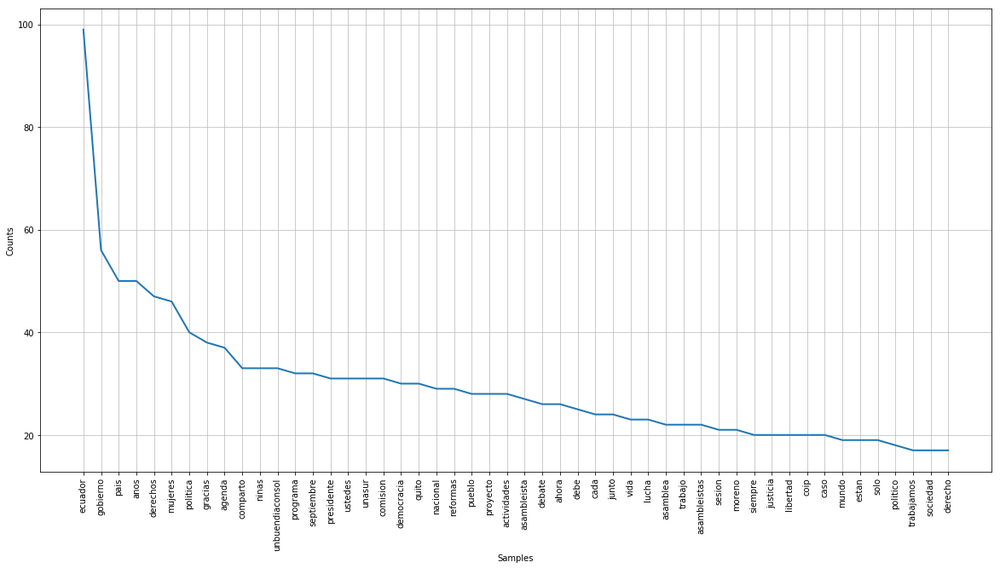

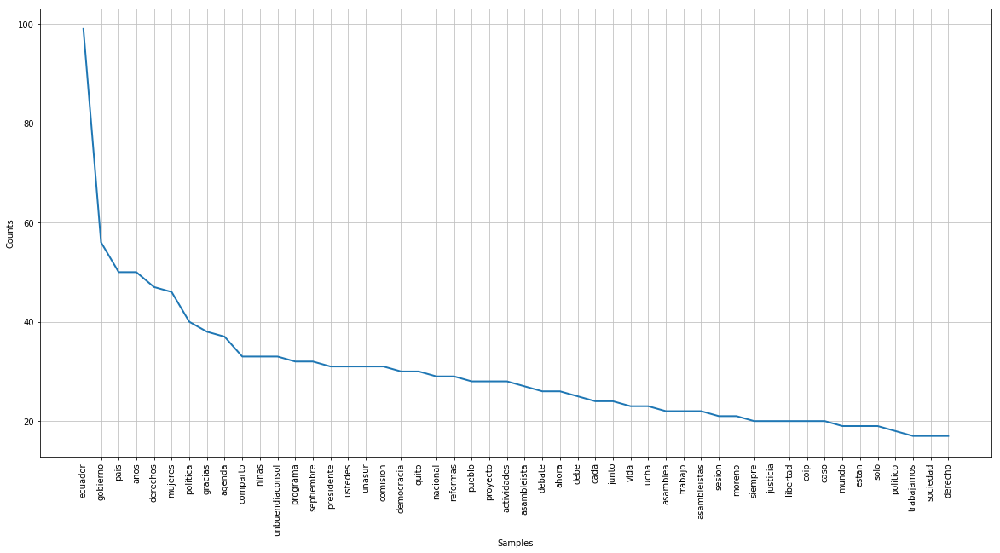

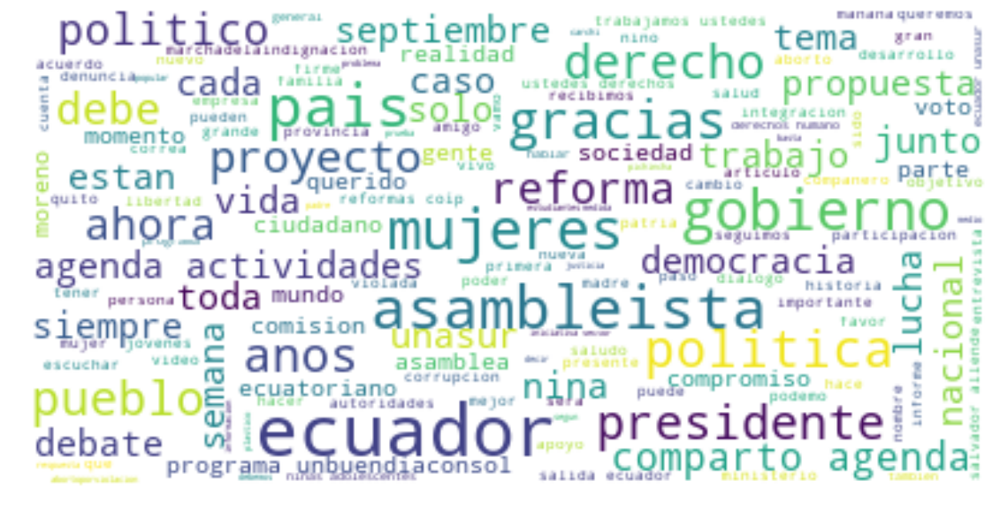

In [77]:
lista_ecu_izquierda_antes = []
lista_ecu_izquierda_antes = agregar_tweets_desde_archivo_a_lista("Lenin.json", (2019,9,1), (2019,10, 1), lista_ecu_izquierda_antes)
lista_ecu_izquierda_antes = agregar_tweets_desde_archivo_a_lista("PenafielEddy.json", (2019,9,1), (2019,10, 1), lista_ecu_izquierda_antes)
lista_ecu_izquierda_antes = agregar_tweets_desde_archivo_a_lista("Fafo_Gavilanez.json", (2019,9,1), (2019,10, 1), lista_ecu_izquierda_antes)
lista_ecu_izquierda_antes = agregar_tweets_desde_archivo_a_lista("EAyalaMora.json", (2019,9,1), (2019,10, 1), lista_ecu_izquierda_antes)
lista_ecu_izquierda_antes = agregar_tweets_desde_archivo_a_lista("JaimeLeonH80.json", (2019,9,1), (2019,10, 1), lista_ecu_izquierda_antes)

lista_ecu_izquierda_antes = agregar_tweets_desde_archivo_a_lista("GabrielaCerdaEc.json", (2019,9,1), (2019,10, 1), lista_ecu_izquierda_antes)
lista_ecu_izquierda_antes = agregar_tweets_desde_archivo_a_lista("EncaDuchi.json", (2019,9,1), (2019,10, 1), lista_ecu_izquierda_antes)
lista_ecu_izquierda_antes = agregar_tweets_desde_archivo_a_lista("Wilmandrade.json", (2019,9,1), (2019,10, 1), lista_ecu_izquierda_antes)
lista_ecu_izquierda_antes = agregar_tweets_desde_archivo_a_lista("GabrielaEsPais.json", (2019,9,1), (2019,10, 1), lista_ecu_izquierda_antes)
lista_ecu_izquierda_antes = agregar_tweets_desde_archivo_a_lista("solbuendia.json", (2019,9,1), (2019,10, 1), lista_ecu_izquierda_antes)

tweets_normalizados = normalizar_tweets_desde_lista(lista_ecu_izquierda_antes)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

plot_freq_dist_palabras(palabras_en_tweets, "ecuador/freq_dist/izquierda_antes.png")
wordcloud_tweets(palabras_en_tweets, "ecuador/wordcloud/izquierda_antes.png")

Tweets agregados. Cantidad de tweets en la lista:  40
Tweets agregados. Cantidad de tweets en la lista:  50
Tweets agregados. Cantidad de tweets en la lista:  61
Tweets agregados. Cantidad de tweets en la lista:  153
Tweets agregados. Cantidad de tweets en la lista:  157
Tweets agregados. Cantidad de tweets en la lista:  163
Tweets agregados. Cantidad de tweets en la lista:  166
Tweets agregados. Cantidad de tweets en la lista:  215
Tweets agregados. Cantidad de tweets en la lista:  854
Tweets agregados. Cantidad de tweets en la lista:  968
Tweets normalizados
Tweets tokenizados
<FreqDist with 3432 samples and 7957 outcomes>


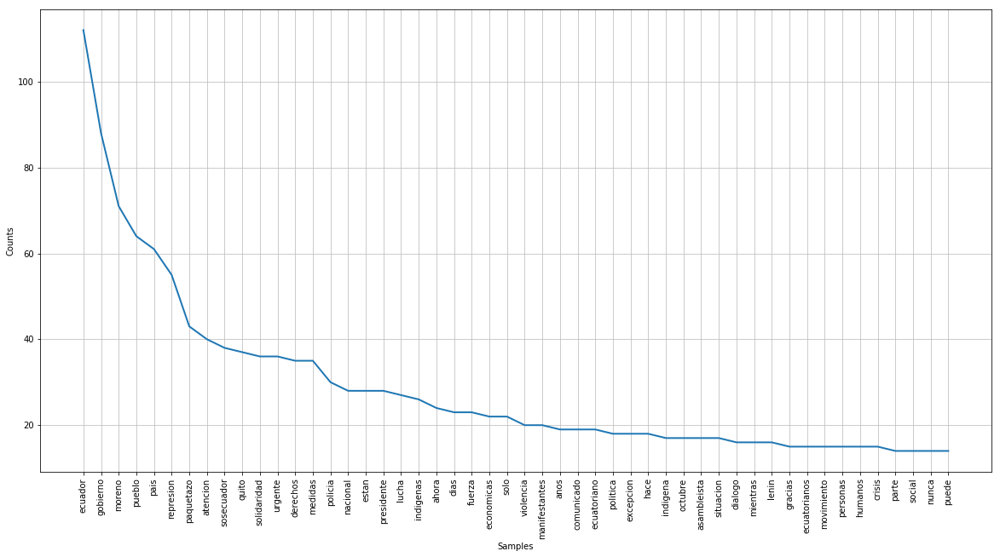

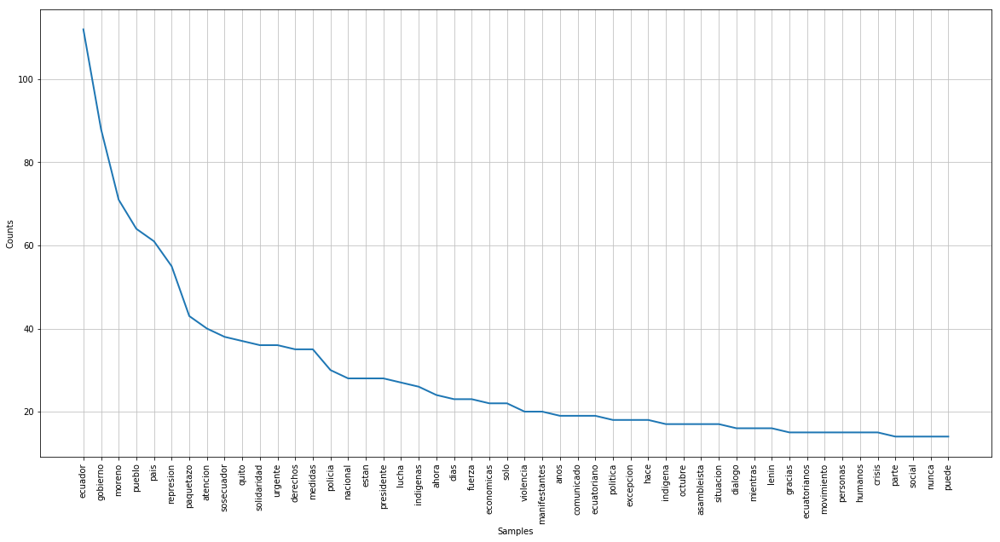

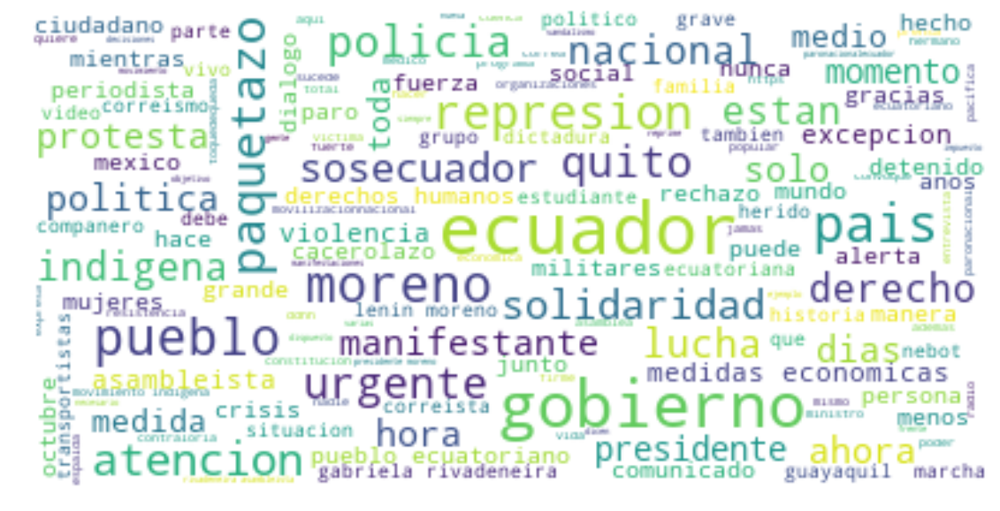

In [78]:
lista_ecu_izquierda_durante = []
lista_ecu_izquierda_durante = agregar_tweets_desde_archivo_a_lista("Lenin.json", (2019,10,2), (2019,10, 13), lista_ecu_izquierda_durante)
lista_ecu_izquierda_durante = agregar_tweets_desde_archivo_a_lista("PenafielEddy.json", (2019,10,2), (2019,10, 13), lista_ecu_izquierda_durante)
lista_ecu_izquierda_durante = agregar_tweets_desde_archivo_a_lista("Fafo_Gavilanez.json", (2019,10,2), (2019,10, 13), lista_ecu_izquierda_durante)
lista_ecu_izquierda_durante = agregar_tweets_desde_archivo_a_lista("EAyalaMora.json", (2019,10,2), (2019,10, 13), lista_ecu_izquierda_durante)
lista_ecu_izquierda_durante = agregar_tweets_desde_archivo_a_lista("JaimeLeonH80.json", (2019,10,2), (2019,10, 13), lista_ecu_izquierda_durante)

lista_ecu_izquierda_durante = agregar_tweets_desde_archivo_a_lista("GabrielaCerdaEc.json", (2019,10,2), (2019,10, 13), lista_ecu_izquierda_durante)
lista_ecu_izquierda_durante = agregar_tweets_desde_archivo_a_lista("EncaDuchi.json", (2019,10,2), (2019,10, 13), lista_ecu_izquierda_durante)
lista_ecu_izquierda_durante = agregar_tweets_desde_archivo_a_lista("Wilmandrade.json", (2019,10,2), (2019,10, 13), lista_ecu_izquierda_durante)
lista_ecu_izquierda_durante = agregar_tweets_desde_archivo_a_lista("GabrielaEsPais.json", (2019,10,2), (2019,10, 13), lista_ecu_izquierda_durante)
lista_ecu_izquierda_durante = agregar_tweets_desde_archivo_a_lista("solbuendia.json", (2019,10,2), (2019,10, 13), lista_ecu_izquierda_durante)

tweets_normalizados = normalizar_tweets_desde_lista(lista_ecu_izquierda_durante)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

plot_freq_dist_palabras(palabras_en_tweets, "ecuador/freq_dist/izquierda_durante.png")
wordcloud_tweets(palabras_en_tweets, "ecuador/wordcloud/izquierda_durante.png")

Tweets agregados. Cantidad de tweets en la lista:  246
Tweets agregados. Cantidad de tweets en la lista:  400
Tweets agregados. Cantidad de tweets en la lista:  838
Tweets agregados. Cantidad de tweets en la lista:  1370
Tweets agregados. Cantidad de tweets en la lista:  1371
Tweets agregados. Cantidad de tweets en la lista:  1446
Tweets agregados. Cantidad de tweets en la lista:  1597
Tweets agregados. Cantidad de tweets en la lista:  1842
Tweets agregados. Cantidad de tweets en la lista:  3343
Tweets agregados. Cantidad de tweets en la lista:  3555
Tweets normalizados
Tweets tokenizados
<FreqDist with 9314 samples and 29104 outcomes>


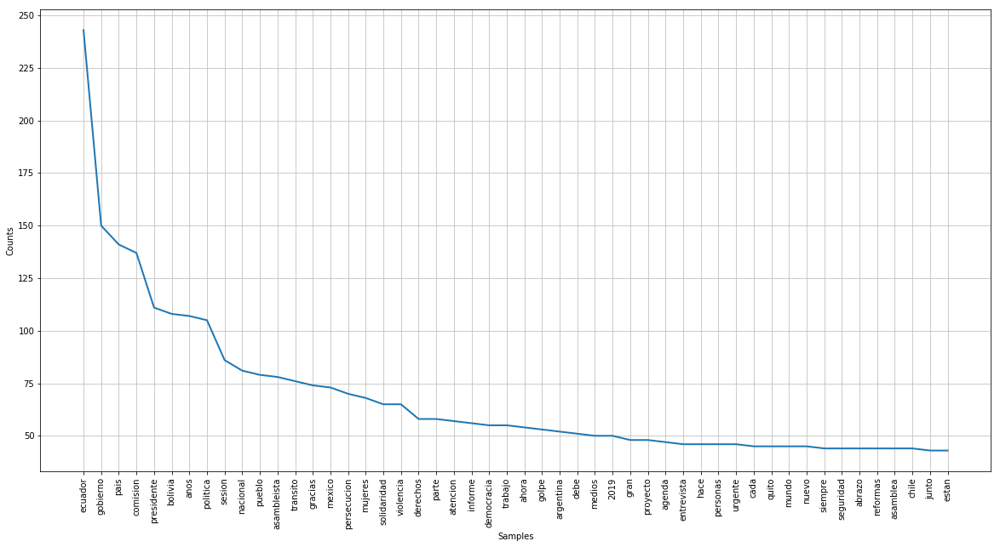

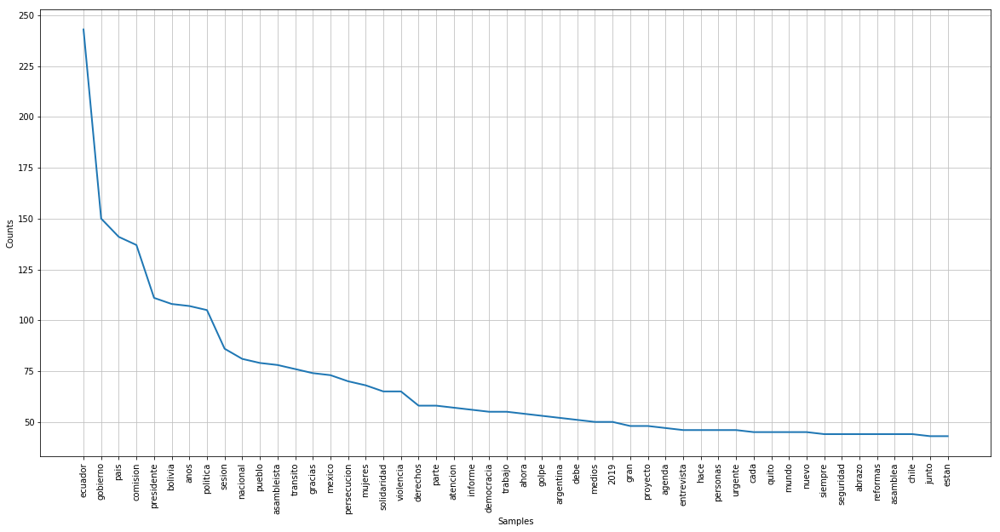

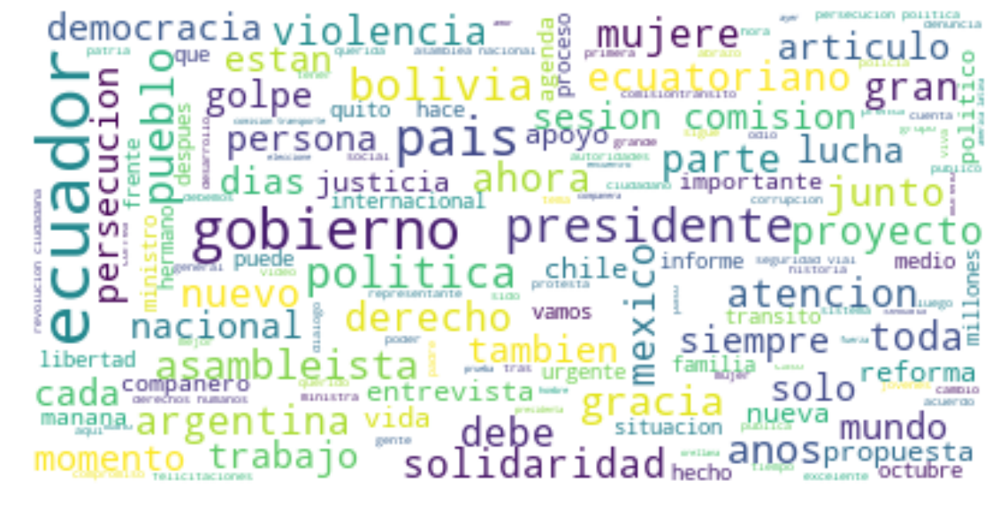

In [79]:
lista_ecu_izquierda_despues = []
lista_ecu_izquierda_despues = agregar_tweets_desde_archivo_a_lista("Lenin.json", (2019,10,14), (2020,11, 13), lista_ecu_izquierda_despues)
lista_ecu_izquierda_despues = agregar_tweets_desde_archivo_a_lista("PenafielEddy.json", (2019,10,14), (2020,11, 13), lista_ecu_izquierda_despues)
lista_ecu_izquierda_despues = agregar_tweets_desde_archivo_a_lista("Fafo_Gavilanez.json", (2019,10,14), (2020,11, 13), lista_ecu_izquierda_despues)
lista_ecu_izquierda_despues = agregar_tweets_desde_archivo_a_lista("EAyalaMora.json", (2019,10,14), (2020,11, 13), lista_ecu_izquierda_despues)
lista_ecu_izquierda_despues = agregar_tweets_desde_archivo_a_lista("JaimeLeonH80.json", (2019,10,14), (2020,11, 13), lista_ecu_izquierda_despues)

lista_ecu_izquierda_despues = agregar_tweets_desde_archivo_a_lista("GabrielaCerdaEc.json", (2019,10,14), (2020,11, 13), lista_ecu_izquierda_despues)
lista_ecu_izquierda_despues = agregar_tweets_desde_archivo_a_lista("EncaDuchi.json", (2019,10,14), (2020,11, 13), lista_ecu_izquierda_despues)
lista_ecu_izquierda_despues = agregar_tweets_desde_archivo_a_lista("Wilmandrade.json", (2019,10,14), (2020,11, 13), lista_ecu_izquierda_despues)
lista_ecu_izquierda_despues = agregar_tweets_desde_archivo_a_lista("GabrielaEsPais.json", (2019,10,14), (2020,11, 13), lista_ecu_izquierda_despues)
lista_ecu_izquierda_despues = agregar_tweets_desde_archivo_a_lista("solbuendia.json", (2019,10,14), (2020,11, 13), lista_ecu_izquierda_despues)

tweets_normalizados = normalizar_tweets_desde_lista(lista_ecu_izquierda_despues)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

plot_freq_dist_palabras(palabras_en_tweets, "ecuador/freq_dist/izquierda_despues.png")
wordcloud_tweets(palabras_en_tweets, "ecuador/wordcloud/izquierda_despues.png")

Tweets agregados. Cantidad de tweets en la lista:  10
Tweets agregados. Cantidad de tweets en la lista:  24
Tweets agregados. Cantidad de tweets en la lista:  101
Tweets agregados. Cantidad de tweets en la lista:  571
Tweets agregados. Cantidad de tweets en la lista:  1151
Tweets agregados. Cantidad de tweets en la lista:  1153
Tweets agregados. Cantidad de tweets en la lista:  1515
Tweets agregados. Cantidad de tweets en la lista:  1554
Tweets agregados. Cantidad de tweets en la lista:  1573
Tweets normalizados
Tweets tokenizados
<FreqDist with 5292 samples and 12989 outcomes>


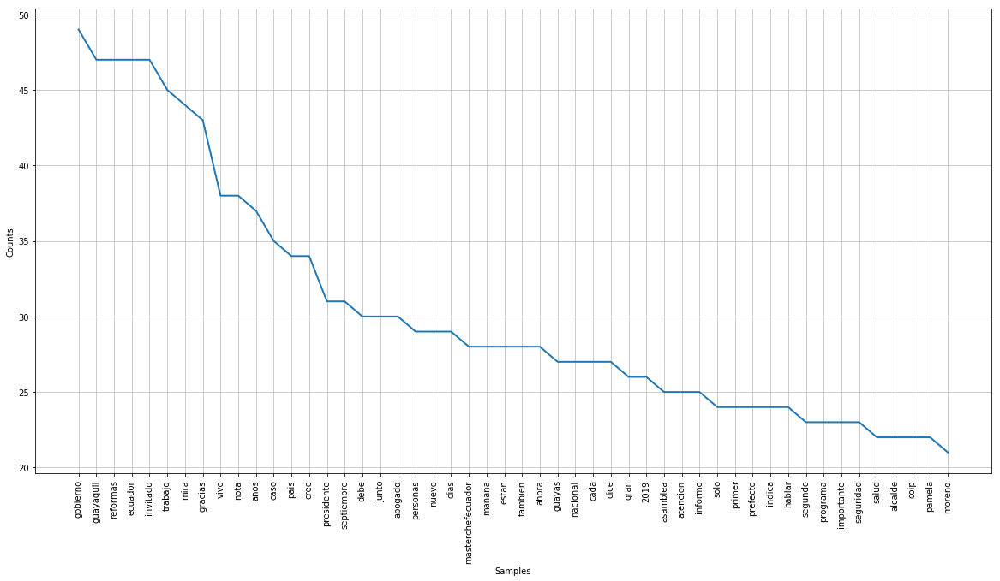

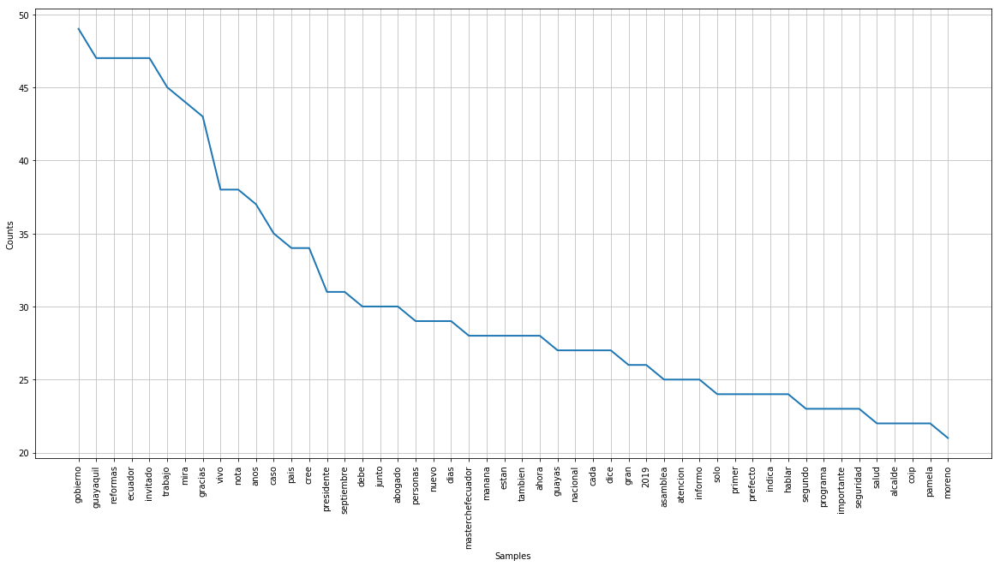

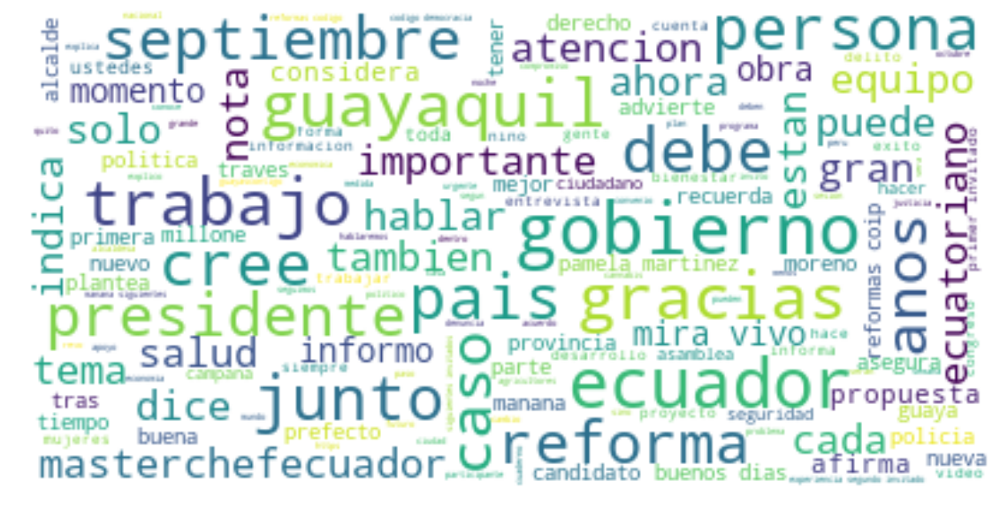

In [80]:
lista_ecu_centro_antes = []
lista_ecu_centro_antes = agregar_tweets_desde_archivo_a_lista("nathalytoledo.json", (2019,9,1), (2019,10, 1), lista_ecu_centro_antes)
lista_ecu_centro_antes = agregar_tweets_desde_archivo_a_lista("karlasacoto.json", (2019,9,1), (2019,10, 1), lista_ecu_centro_antes)
lista_ecu_centro_antes = agregar_tweets_desde_archivo_a_lista("lizvalarezo.json", (2019,9,1), (2019,10, 1), lista_ecu_centro_antes)
lista_ecu_centro_antes = agregar_tweets_desde_archivo_a_lista("VeronicaLoaizaV.json", (2019,9,1), (2019,10, 1), lista_ecu_centro_antes)

lista_ecu_centro_antes = agregar_tweets_desde_archivo_a_lista("jimmyjairala.json", (2019,9,1), (2019,10, 1), lista_ecu_centro_antes)
lista_ecu_centro_antes = agregar_tweets_desde_archivo_a_lista("_alextortol.json", (2019,9,1), (2019,10, 1), lista_ecu_centro_antes)
lista_ecu_centro_antes = agregar_tweets_desde_archivo_a_lista("JorgeVelezVelez.json", (2019,9,1), (2019,10, 1), lista_ecu_centro_antes)
lista_ecu_centro_antes = agregar_tweets_desde_archivo_a_lista("jpvelin.json", (2019,9,1), (2019,10, 1), lista_ecu_centro_antes)
lista_ecu_centro_antes = agregar_tweets_desde_archivo_a_lista("YandunRene.json", (2019,9,1), (2019,10, 1), lista_ecu_centro_antes)

tweets_normalizados = normalizar_tweets_desde_lista(lista_ecu_centro_antes)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

plot_freq_dist_palabras(palabras_en_tweets, "ecuador/freq_dist/centro_antes.png")
wordcloud_tweets(palabras_en_tweets, "ecuador/wordcloud/centro_antes.png")

Tweets agregados. Cantidad de tweets en la lista:  12
Tweets agregados. Cantidad de tweets en la lista:  121
Tweets agregados. Cantidad de tweets en la lista:  314
Tweets agregados. Cantidad de tweets en la lista:  463
Tweets agregados. Cantidad de tweets en la lista:  762
Tweets agregados. Cantidad de tweets en la lista:  762
Tweets agregados. Cantidad de tweets en la lista:  855
Tweets agregados. Cantidad de tweets en la lista:  861
Tweets agregados. Cantidad de tweets en la lista:  871
Tweets normalizados
Tweets tokenizados
<FreqDist with 2927 samples and 7244 outcomes>


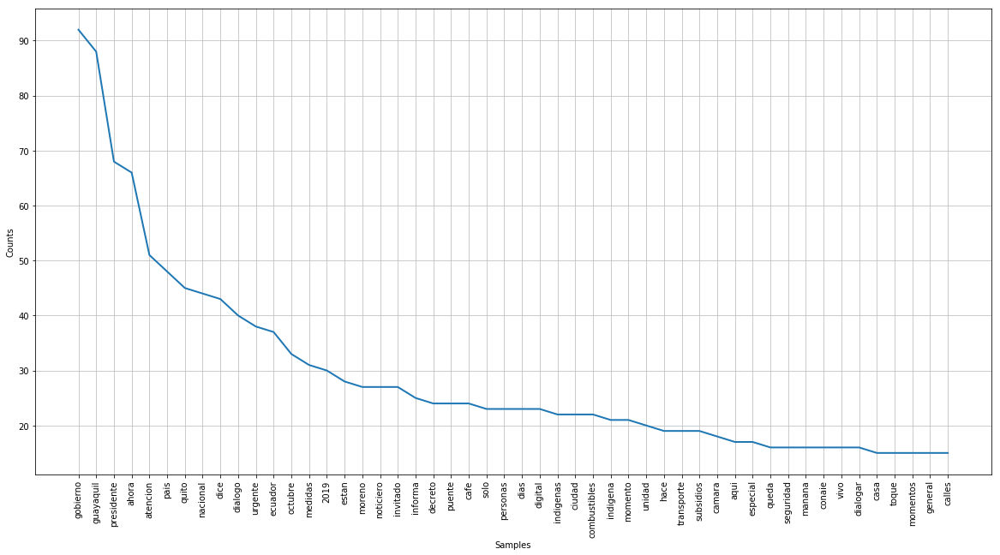

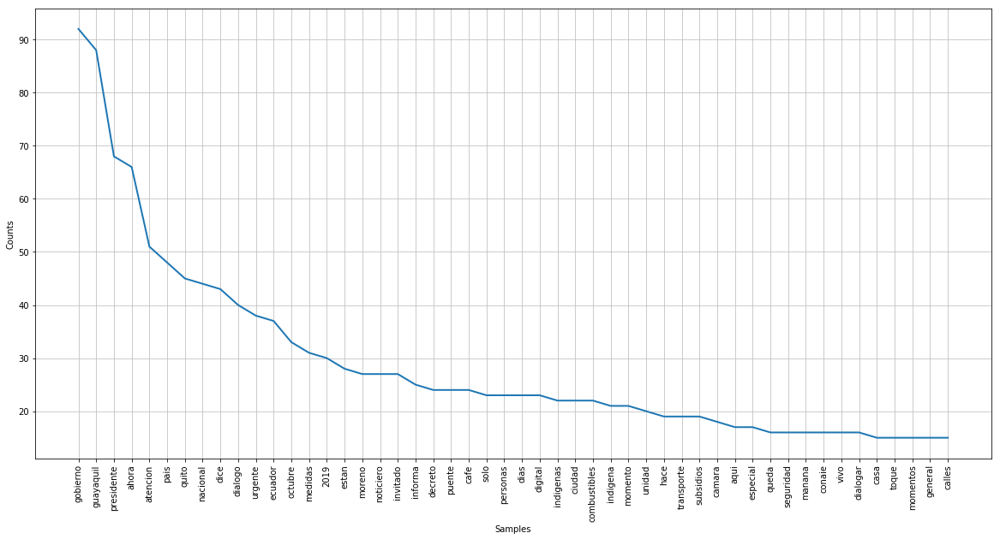

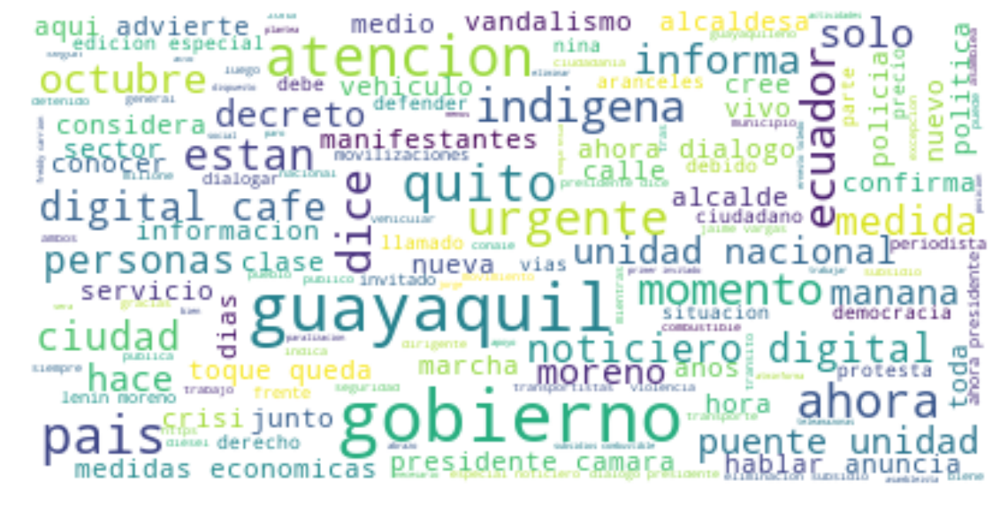

In [81]:
lista_ecu_centro_durante = []
lista_ecu_centro_durante = agregar_tweets_desde_archivo_a_lista("nathalytoledo.json", (2019,10,2), (2019,10, 13), lista_ecu_centro_durante)
lista_ecu_centro_durante = agregar_tweets_desde_archivo_a_lista("karlasacoto.json", (2019,10,2), (2019,10, 13), lista_ecu_centro_durante)
lista_ecu_centro_durante = agregar_tweets_desde_archivo_a_lista("lizvalarezo.json", (2019,10,2), (2019,10, 13), lista_ecu_centro_durante)
lista_ecu_centro_durante = agregar_tweets_desde_archivo_a_lista("VeronicaLoaizaV.json", (2019,10,2), (2019,10, 13), lista_ecu_centro_durante)

lista_ecu_centro_durante = agregar_tweets_desde_archivo_a_lista("jimmyjairala.json", (2019,10,2), (2019,10, 13), lista_ecu_centro_durante)
lista_ecu_centro_durante = agregar_tweets_desde_archivo_a_lista("_alextortol.json", (2019,10,2), (2019,10, 13), lista_ecu_centro_durante)
lista_ecu_centro_durante = agregar_tweets_desde_archivo_a_lista("JorgeVelezVelez.json", (2019,10,2), (2019,10, 13), lista_ecu_centro_durante)
lista_ecu_centro_durante = agregar_tweets_desde_archivo_a_lista("jpvelin.json", (2019,10,2), (2019,10, 13), lista_ecu_centro_durante)
lista_ecu_centro_durante = agregar_tweets_desde_archivo_a_lista("YandunRene.json", (2019,10,2), (2019,10, 13), lista_ecu_centro_durante)

tweets_normalizados = normalizar_tweets_desde_lista(lista_ecu_centro_durante)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

plot_freq_dist_palabras(palabras_en_tweets, "ecuador/freq_dist/centro_durante.png")
wordcloud_tweets(palabras_en_tweets, "ecuador/wordcloud/centro_durante.png")

Tweets agregados. Cantidad de tweets en la lista:  75
Tweets agregados. Cantidad de tweets en la lista:  138
Tweets agregados. Cantidad de tweets en la lista:  403
Tweets agregados. Cantidad de tweets en la lista:  760
Tweets agregados. Cantidad de tweets en la lista:  2168
Tweets agregados. Cantidad de tweets en la lista:  2169
Tweets agregados. Cantidad de tweets en la lista:  3433
Tweets agregados. Cantidad de tweets en la lista:  3510
Tweets agregados. Cantidad de tweets en la lista:  3546
Tweets normalizados
Tweets tokenizados
<FreqDist with 9134 samples and 27349 outcomes>


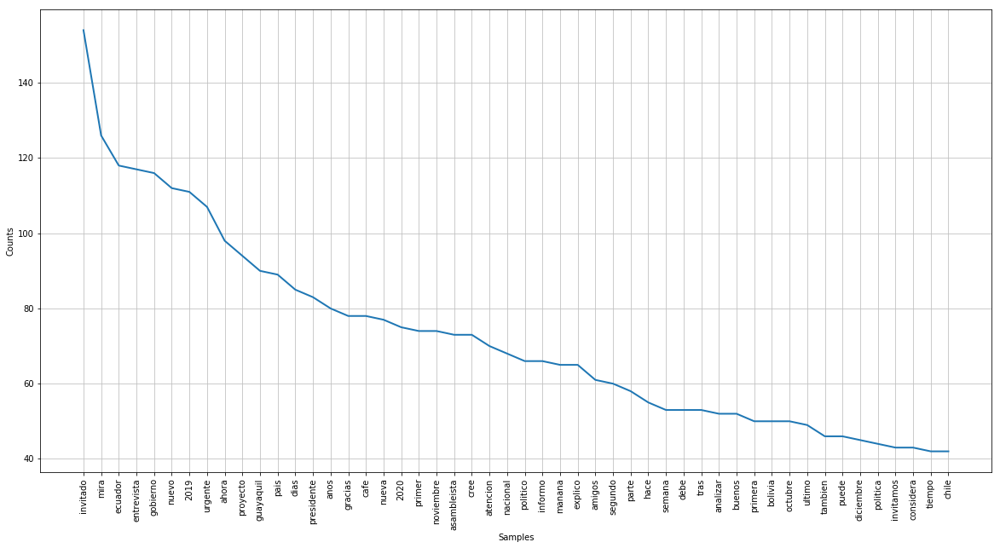

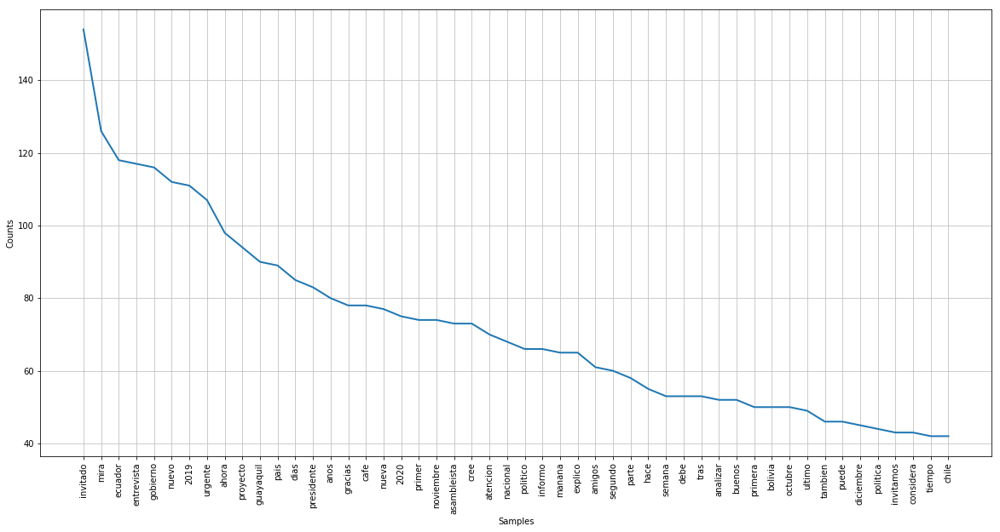

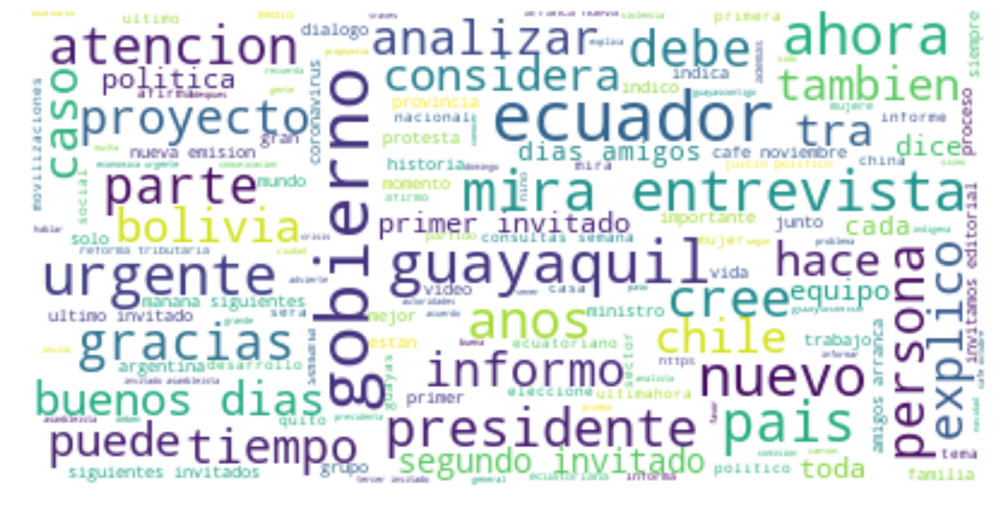

In [82]:
lista_ecu_centro_despues = []
lista_ecu_centro_despues = agregar_tweets_desde_archivo_a_lista("nathalytoledo.json", (2019,10,14), (2020,11, 13), lista_ecu_centro_despues)
lista_ecu_centro_despues = agregar_tweets_desde_archivo_a_lista("karlasacoto.json", (2019,10,14), (2020,11, 13), lista_ecu_centro_despues)
lista_ecu_centro_despues = agregar_tweets_desde_archivo_a_lista("lizvalarezo.json", (2019,10,14), (2020,11, 13), lista_ecu_centro_despues)
lista_ecu_centro_despues = agregar_tweets_desde_archivo_a_lista("VeronicaLoaizaV.json", (2019,10,14), (2020,11, 13), lista_ecu_centro_despues)

lista_ecu_centro_despues = agregar_tweets_desde_archivo_a_lista("jimmyjairala.json", (2019,10,14), (2020,11, 13), lista_ecu_centro_despues)
lista_ecu_centro_despues = agregar_tweets_desde_archivo_a_lista("_alextortol.json", (2019,10,14), (2020,11, 13), lista_ecu_centro_despues)
lista_ecu_centro_despues = agregar_tweets_desde_archivo_a_lista("JorgeVelezVelez.json", (2019,10,14), (2020,11, 13), lista_ecu_centro_despues)
lista_ecu_centro_despues = agregar_tweets_desde_archivo_a_lista("jpvelin.json", (2019,10,14), (2020,11, 13), lista_ecu_centro_despues)
lista_ecu_centro_despues = agregar_tweets_desde_archivo_a_lista("YandunRene.json", (2019,10,14), (2020,11, 13), lista_ecu_centro_despues)

tweets_normalizados = normalizar_tweets_desde_lista(lista_ecu_centro_despues)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

plot_freq_dist_palabras(palabras_en_tweets, "ecuador/freq_dist/centro_despues.png")
wordcloud_tweets(palabras_en_tweets, "ecuador/wordcloud/centro_despues.png")

Tweets agregados. Cantidad de tweets en la lista:  148
Tweets agregados. Cantidad de tweets en la lista:  168
Tweets agregados. Cantidad de tweets en la lista:  342
Tweets agregados. Cantidad de tweets en la lista:  407
Tweets agregados. Cantidad de tweets en la lista:  608
Tweets agregados. Cantidad de tweets en la lista:  636
Tweets agregados. Cantidad de tweets en la lista:  686
Tweets agregados. Cantidad de tweets en la lista:  737
Tweets agregados. Cantidad de tweets en la lista:  844
Tweets agregados. Cantidad de tweets en la lista:  966
Tweets normalizados
Tweets tokenizados
<FreqDist with 3186 samples and 7213 outcomes>


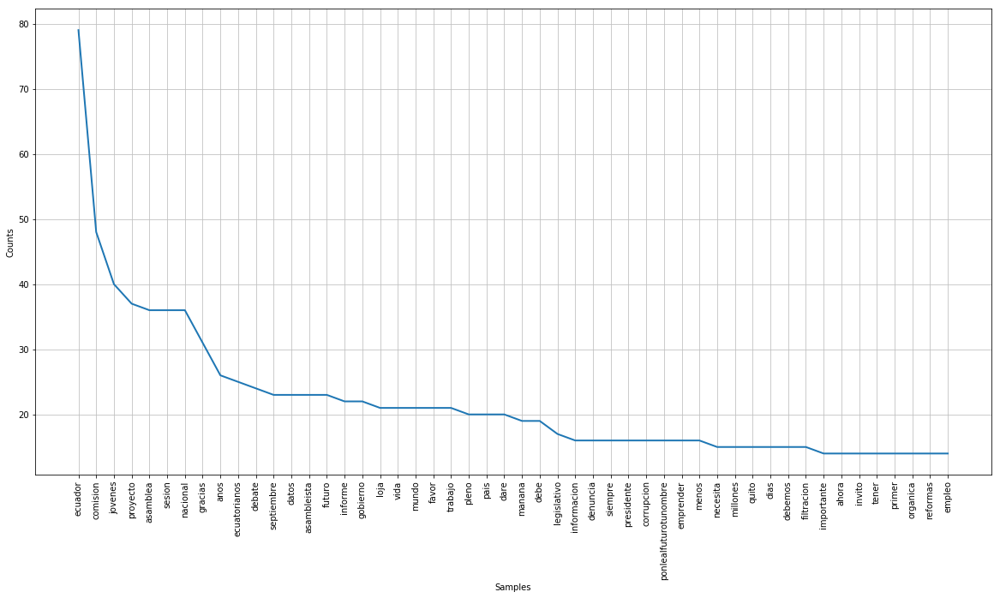

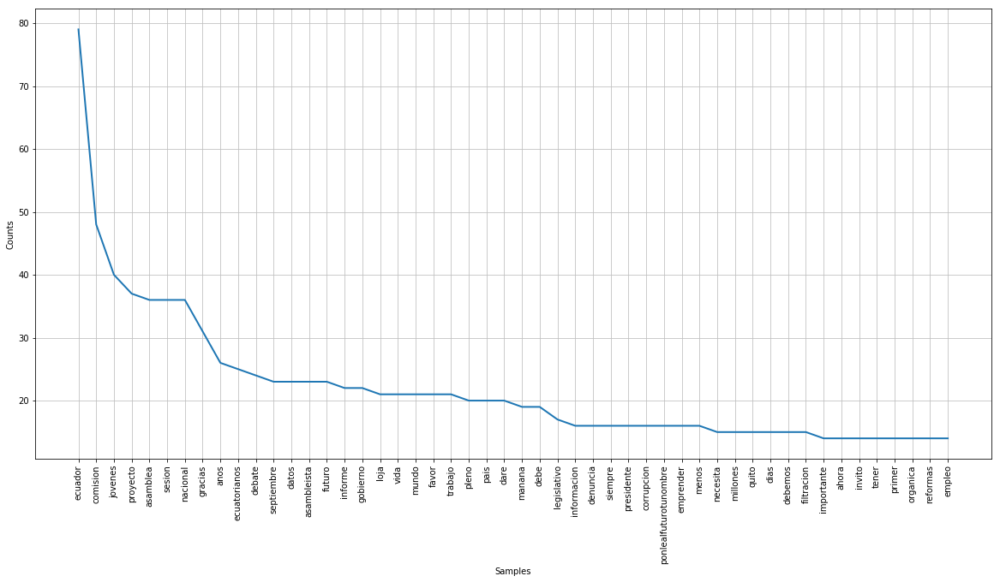

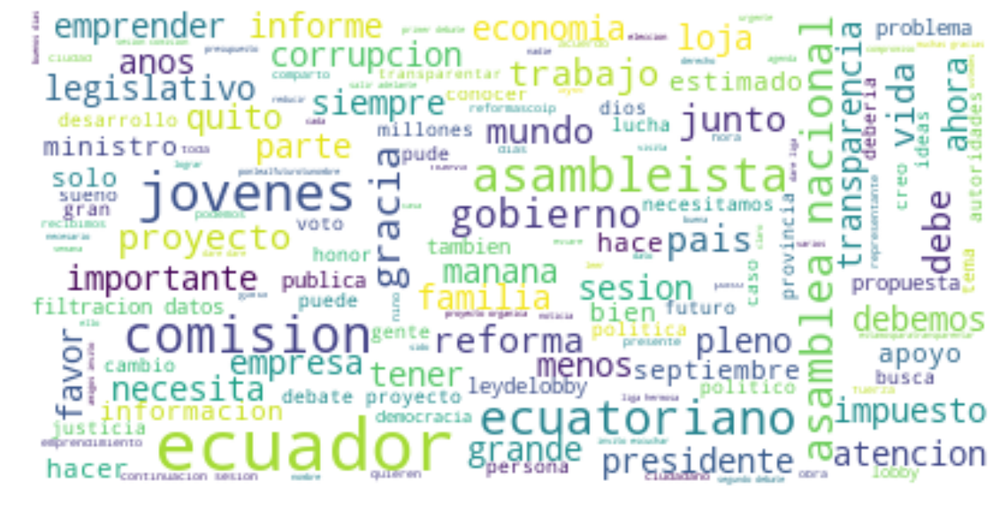

In [83]:
lista_ecu_derecha_antes = []
lista_ecu_derecha_antes = agregar_tweets_desde_archivo_a_lista("Jeanninecruzz.json", (2019,9,1), (2019,10, 1), lista_ecu_derecha_antes)
lista_ecu_derecha_antes = agregar_tweets_desde_archivo_a_lista("RinaCampainB.json", (2019,9,1), (2019,10, 1), lista_ecu_derecha_antes)
lista_ecu_derecha_antes = agregar_tweets_desde_archivo_a_lista("TanllyVera.json", (2019,9,1), (2019,10, 1), lista_ecu_derecha_antes)
lista_ecu_derecha_antes = agregar_tweets_desde_archivo_a_lista("PaolaVintimilla.json", (2019,9,1), (2019,10, 1), lista_ecu_derecha_antes)
lista_ecu_derecha_antes = agregar_tweets_desde_archivo_a_lista("Gabitegui.json", (2019,9,1), (2019,10, 1), lista_ecu_derecha_antes)

lista_ecu_derecha_antes = agregar_tweets_desde_archivo_a_lista("Fernandcallejas.json", (2019,9,1), (2019,10, 1), lista_ecu_derecha_antes)
lista_ecu_derecha_antes = agregar_tweets_desde_archivo_a_lista("hcastanierj.json", (2019,9,1), (2019,10, 1), lista_ecu_derecha_antes)
lista_ecu_derecha_antes = agregar_tweets_desde_archivo_a_lista("raulauquilla21.json", (2019,9,1), (2019,10, 1), lista_ecu_derecha_antes)
lista_ecu_derecha_antes = agregar_tweets_desde_archivo_a_lista("csolorzano3.json", (2019,9,1), (2019,10, 1), lista_ecu_derecha_antes)
lista_ecu_derecha_antes = agregar_tweets_desde_archivo_a_lista("LassoGuillermo.json", (2019,9,1), (2019,10, 1), lista_ecu_derecha_antes)

tweets_normalizados = normalizar_tweets_desde_lista(lista_ecu_derecha_antes)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

plot_freq_dist_palabras(palabras_en_tweets, "ecuador/freq_dist/derecha_antes.png")
wordcloud_tweets(palabras_en_tweets, "ecuador/wordcloud/derecha_antes.png")

Tweets agregados. Cantidad de tweets en la lista:  245
Tweets agregados. Cantidad de tweets en la lista:  260
Tweets agregados. Cantidad de tweets en la lista:  355
Tweets agregados. Cantidad de tweets en la lista:  478
Tweets agregados. Cantidad de tweets en la lista:  564
Tweets agregados. Cantidad de tweets en la lista:  576
Tweets agregados. Cantidad de tweets en la lista:  593
Tweets agregados. Cantidad de tweets en la lista:  630
Tweets agregados. Cantidad de tweets en la lista:  682
Tweets agregados. Cantidad de tweets en la lista:  693
Tweets normalizados
Tweets tokenizados
<FreqDist with 2457 samples and 5173 outcomes>


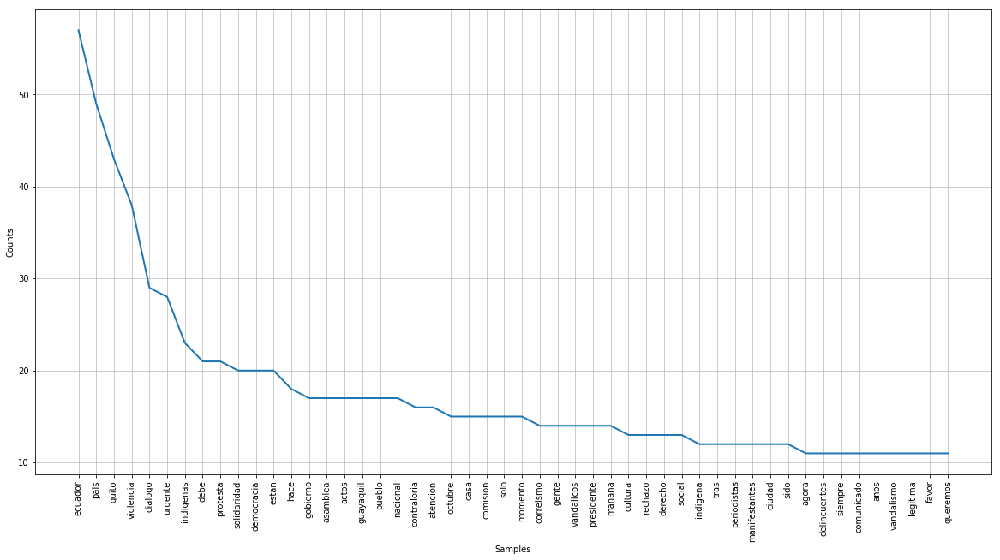

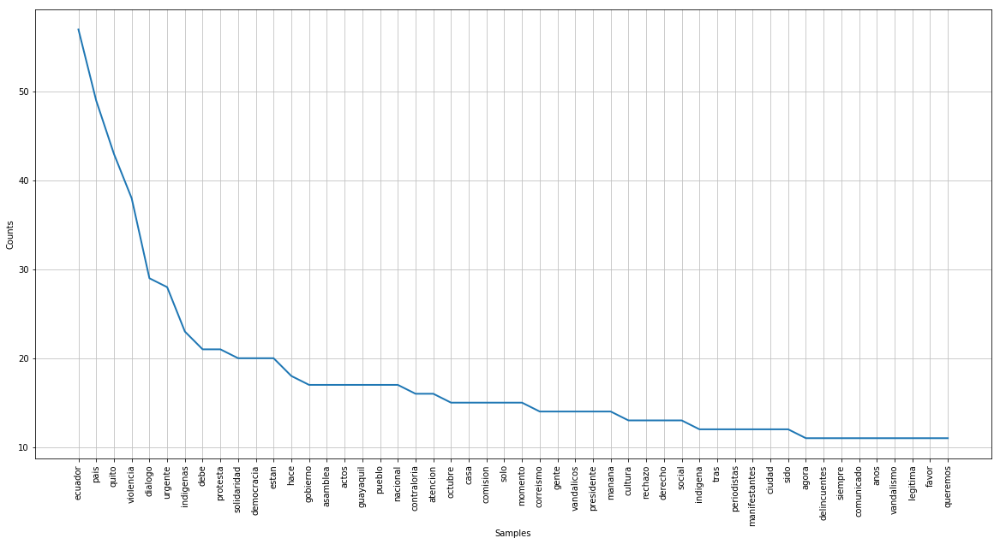

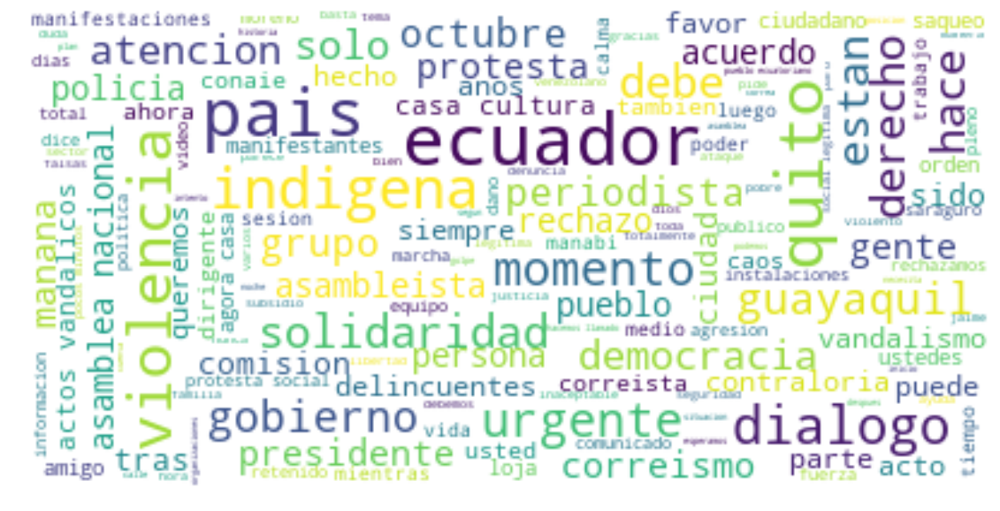

In [84]:
lista_ecu_derecha_durante = []
lista_ecu_derecha_durante = agregar_tweets_desde_archivo_a_lista("Jeanninecruzz.json", (2019,10,2), (2019,10, 13), lista_ecu_derecha_durante)
lista_ecu_derecha_durante = agregar_tweets_desde_archivo_a_lista("RinaCampainB.json", (2019,10,2), (2019,10, 13), lista_ecu_derecha_durante)
lista_ecu_derecha_durante = agregar_tweets_desde_archivo_a_lista("TanllyVera.json", (2019,10,2), (2019,10, 13), lista_ecu_derecha_durante)
lista_ecu_derecha_durante = agregar_tweets_desde_archivo_a_lista("PaolaVintimilla.json", (2019,10,2), (2019,10, 13), lista_ecu_derecha_durante)
lista_ecu_derecha_durante = agregar_tweets_desde_archivo_a_lista("Gabitegui.json", (2019,10,2), (2019,10, 13), lista_ecu_derecha_durante)

lista_ecu_derecha_durante = agregar_tweets_desde_archivo_a_lista("Fernandcallejas.json", (2019,10,2), (2019,10, 13), lista_ecu_derecha_durante)
lista_ecu_derecha_durante = agregar_tweets_desde_archivo_a_lista("hcastanierj.json", (2019,10,2), (2019,10, 13), lista_ecu_derecha_durante)
lista_ecu_derecha_durante = agregar_tweets_desde_archivo_a_lista("raulauquilla21.json", (2019,10,2), (2019,10, 13), lista_ecu_derecha_durante)
lista_ecu_derecha_durante = agregar_tweets_desde_archivo_a_lista("csolorzano3.json", (2019,10,2), (2019,10, 13), lista_ecu_derecha_durante)
lista_ecu_derecha_durante = agregar_tweets_desde_archivo_a_lista("LassoGuillermo.json", (2019,10,2), (2019,10, 13), lista_ecu_derecha_durante)

tweets_normalizados = normalizar_tweets_desde_lista(lista_ecu_derecha_durante)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

plot_freq_dist_palabras(palabras_en_tweets, "ecuador/freq_dist/derecha_durante.png")
wordcloud_tweets(palabras_en_tweets, "ecuador/wordcloud/derecha_durante.png")

Tweets agregados. Cantidad de tweets en la lista:  861
Tweets agregados. Cantidad de tweets en la lista:  993
Tweets agregados. Cantidad de tweets en la lista:  1398
Tweets agregados. Cantidad de tweets en la lista:  1711
Tweets agregados. Cantidad de tweets en la lista:  2402
Tweets agregados. Cantidad de tweets en la lista:  2522
Tweets agregados. Cantidad de tweets en la lista:  2792
Tweets agregados. Cantidad de tweets en la lista:  2977
Tweets agregados. Cantidad de tweets en la lista:  3255
Tweets agregados. Cantidad de tweets en la lista:  3417
Tweets normalizados
Tweets tokenizados
<FreqDist with 7408 samples and 24970 outcomes>


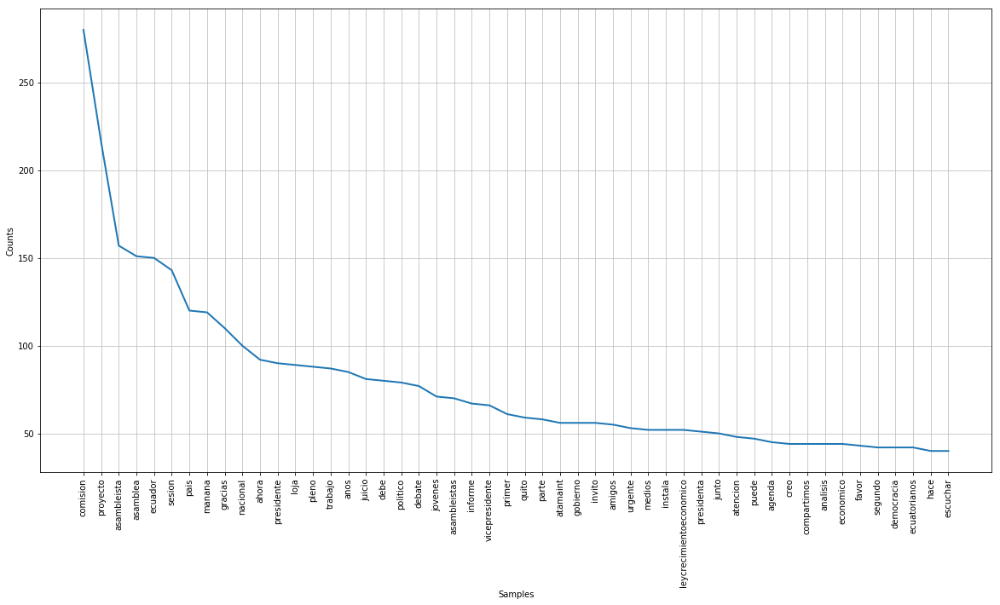

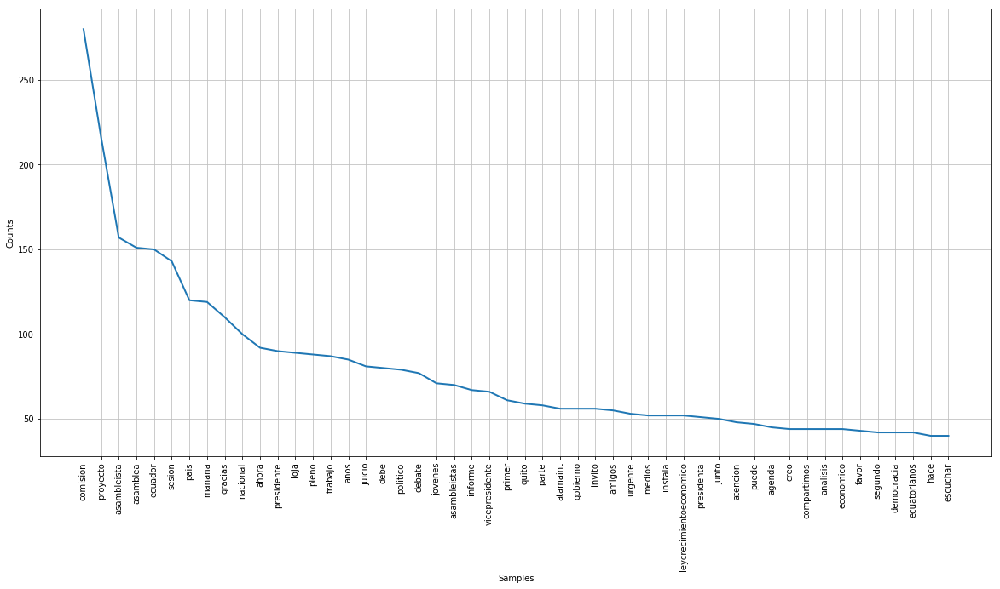

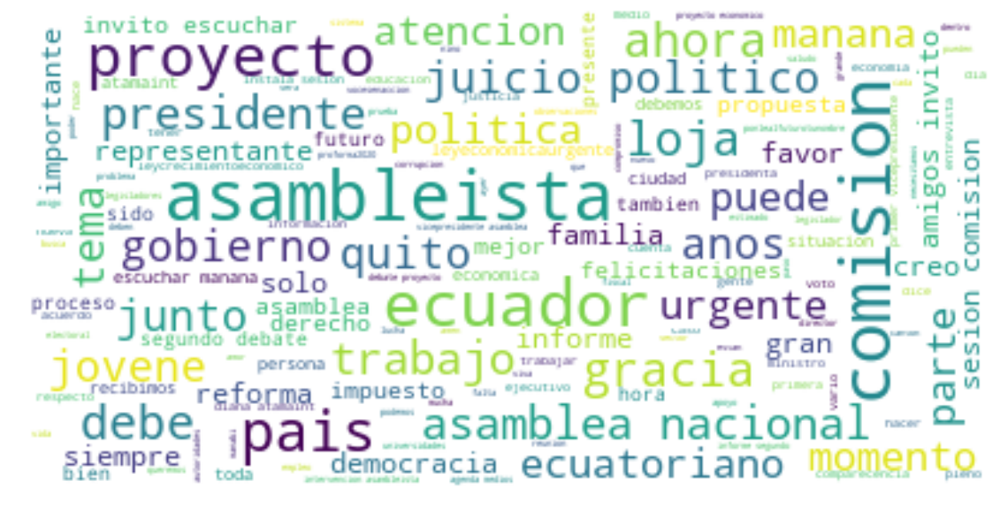

In [85]:
lista_ecu_derecha_despues = []
lista_ecu_derecha_despues = agregar_tweets_desde_archivo_a_lista("Jeanninecruzz.json", (2019,10,14), (2020,11, 13), lista_ecu_derecha_despues)
lista_ecu_derecha_despues = agregar_tweets_desde_archivo_a_lista("RinaCampainB.json", (2019,10,14), (2020,11, 13), lista_ecu_derecha_despues)
lista_ecu_derecha_despues = agregar_tweets_desde_archivo_a_lista("TanllyVera.json", (2019,10,14), (2020,11, 13), lista_ecu_derecha_despues)
lista_ecu_derecha_despues = agregar_tweets_desde_archivo_a_lista("PaolaVintimilla.json", (2019,10,14), (2020,11, 13), lista_ecu_derecha_despues)
lista_ecu_derecha_despues = agregar_tweets_desde_archivo_a_lista("Gabitegui.json", (2019,10,14), (2020,11, 13), lista_ecu_derecha_despues)

lista_ecu_derecha_despues = agregar_tweets_desde_archivo_a_lista("Fernandcallejas.json", (2019,10,14), (2020,11, 13), lista_ecu_derecha_despues)
lista_ecu_derecha_despues = agregar_tweets_desde_archivo_a_lista("hcastanierj.json", (2019,10,14), (2020,11, 13), lista_ecu_derecha_despues)
lista_ecu_derecha_despues = agregar_tweets_desde_archivo_a_lista("raulauquilla21.json", (2019,10,14), (2020,11, 13), lista_ecu_derecha_despues)
lista_ecu_derecha_despues = agregar_tweets_desde_archivo_a_lista("csolorzano3.json", (2019,10,14), (2020,11, 13), lista_ecu_derecha_despues)
lista_ecu_derecha_despues = agregar_tweets_desde_archivo_a_lista("LassoGuillermo.json", (2019,10,14), (2020,11, 13), lista_ecu_derecha_despues)

tweets_normalizados = normalizar_tweets_desde_lista(lista_ecu_derecha_despues)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

plot_freq_dist_palabras(palabras_en_tweets, "ecuador/freq_dist/derecha_despues.png")
wordcloud_tweets(palabras_en_tweets, "ecuador/wordcloud/derecha_despues.png")

In [86]:
#Chile derecha:

obtener_tweets("sebastianpinera", "sebastianpinera.json", (2019,9,1), (2020,2,1))
obtener_tweets("joseantoniokast", "joseantoniokast.json", (2019,9,1), (2020,2,1))
obtener_tweets("LavinJoaquin", "LavinJoaquin.json", (2019,9,1), (2020,2,1))
obtener_tweets("AlessandriFelip", "AlessandriFelip.json", (2019,9,1), (2020,2,1))
obtener_tweets("desbordes", "desbordes.json", (2019,9,1), (2020,2,1))

obtener_tweets("KarlaEnAccion", "KarlaEnAccion.json", (2019,9,1), (2020,2,1))
obtener_tweets("Cami_FloresO", "Cami_FloresO.json", (2019,9,1), (2020,2,1))
obtener_tweets("jvanbiobio", "jvanbiobio.json", (2019,9,1), (2020,2,1))
obtener_tweets("paulinanu", "paulinanu.json", (2019,9,1), (2020,2,1))
obtener_tweets("mcubillossigall", "mcubillossigall.json", (2019,9,1), (2020,2,1))

Last Tweet @ 2020-02-26 00:49:40  - fetching some more
Last Tweet @ 2020-02-04 15:36:07  - fetching some more
Last Tweet @ 2020-01-15 23:33:32  - fetching some more
Last Tweet @ 2019-12-26 17:54:36  - fetching some more
Last Tweet @ 2019-12-10 20:49:06  - fetching some more
Last Tweet @ 2019-11-24 19:09:37  - fetching some more
Last Tweet @ 2019-11-18 00:10:30  - fetching some more
Last Tweet @ 2019-10-31 00:03:19  - fetching some more
Last Tweet @ 2019-10-26 00:25:17  - fetching some more
Last Tweet @ 2019-10-15 00:32:12  - fetching some more
Last Tweet @ 2019-10-03 18:09:47  - fetching some more
Last Tweet @ 2019-09-21 15:50:39  - fetching some more
Last Tweet @ 2019-09-04 13:33:07  - fetching some more
Archivo JSON listo. Tweets obtenidos:  222
Resultados guardados en:  sebastianpinera.json
Last Tweet @ 2020-03-07 12:54:04  - fetching some more
Last Tweet @ 2020-03-06 01:49:38  - fetching some more
Last Tweet @ 2020-03-04 00:25:04  - fetching some more
Last Tweet @ 2020-03-03 01:48:

Last Tweet @ 2020-02-18 14:12:25  - fetching some more
Last Tweet @ 2020-02-18 12:32:38  - fetching some more
Last Tweet @ 2020-02-17 15:58:40  - fetching some more
Last Tweet @ 2020-02-17 14:16:59  - fetching some more
Last Tweet @ 2020-02-15 21:02:35  - fetching some more
Last Tweet @ 2020-02-14 23:45:30  - fetching some more
Last Tweet @ 2020-02-14 15:52:36  - fetching some more
Last Tweet @ 2020-02-14 12:44:57  - fetching some more
Last Tweet @ 2020-02-13 19:13:46  - fetching some more
Last Tweet @ 2020-02-13 12:39:23  - fetching some more
Last Tweet @ 2020-02-12 21:38:27  - fetching some more
Last Tweet @ 2020-02-12 15:09:36  - fetching some more
Last Tweet @ 2020-02-12 00:07:56  - fetching some more
Last Tweet @ 2020-02-11 14:59:35  - fetching some more
Last Tweet @ 2020-02-11 12:13:29  - fetching some more
Last Tweet @ 2020-02-10 17:36:08  - fetching some more
Last Tweet @ 2020-02-10 14:11:47  - fetching some more
Last Tweet @ 2020-02-08 14:45:20  - fetching some more
Last Tweet

IndexError: list index out of range

In [87]:
obtener_tweets("AlessandriFelip", "AlessandriFelip.json", (2019,9,1), (2020,2,1))
obtener_tweets("desbordes", "desbordes.json", (2019,9,1), (2020,2,1))

obtener_tweets("KarlaEnAccion", "KarlaEnAccion.json", (2019,9,1), (2020,2,1))
obtener_tweets("Cami_FloresO", "Cami_FloresO.json", (2019,9,1), (2020,2,1))
obtener_tweets("jvanbiobio", "jvanbiobio.json", (2019,9,1), (2020,2,1))
obtener_tweets("paulinanu", "paulinanu.json", (2019,9,1), (2020,2,1))
obtener_tweets("mcubillossigall", "mcubillossigall.json", (2019,9,1), (2020,2,1))

Last Tweet @ 2020-02-29 18:47:30  - fetching some more
Last Tweet @ 2020-02-20 14:01:55  - fetching some more
Last Tweet @ 2020-02-12 17:23:52  - fetching some more
Last Tweet @ 2020-02-05 16:37:44  - fetching some more
Last Tweet @ 2020-01-21 14:46:11  - fetching some more
Last Tweet @ 2020-01-15 11:41:07  - fetching some more
Last Tweet @ 2020-01-07 00:01:24  - fetching some more
Last Tweet @ 2019-12-27 18:00:57  - fetching some more
Last Tweet @ 2019-12-19 12:17:14  - fetching some more
Last Tweet @ 2019-12-10 19:01:12  - fetching some more
Last Tweet @ 2019-11-30 17:32:21  - fetching some more
Last Tweet @ 2019-11-26 13:44:02  - fetching some more
Last Tweet @ 2019-11-21 17:31:15  - fetching some more
Last Tweet @ 2019-11-13 00:32:09  - fetching some more
Last Tweet @ 2019-11-06 15:47:26  - fetching some more
Last Tweet @ 2019-10-27 23:16:15  - fetching some more
Last Tweet @ 2019-10-24 13:57:26  - fetching some more
Last Tweet @ 2019-10-19 21:11:47  - fetching some more
Last Tweet

Last Tweet @ 2020-02-21 21:13:14  - fetching some more
Last Tweet @ 2020-02-03 11:22:35  - fetching some more
Last Tweet @ 2020-01-26 20:38:06  - fetching some more
Last Tweet @ 2020-01-23 17:15:38  - fetching some more
Last Tweet @ 2020-01-23 14:51:25  - fetching some more
Last Tweet @ 2020-01-16 22:15:47  - fetching some more
Last Tweet @ 2019-12-30 22:58:26  - fetching some more
Last Tweet @ 2019-11-20 15:26:20  - fetching some more
Last Tweet @ 2019-10-29 15:01:20  - fetching some more
Last Tweet @ 2019-10-09 12:18:26  - fetching some more
Last Tweet @ 2019-09-21 12:19:00  - fetching some more
Last Tweet @ 2019-09-05 17:48:00  - fetching some more
Archivo JSON listo. Tweets obtenidos:  190
Resultados guardados en:  jvanbiobio.json
Last Tweet @ 2020-02-04 18:08:46  - fetching some more
Last Tweet @ 2020-01-16 00:25:44  - fetching some more
Last Tweet @ 2019-12-25 14:44:21  - fetching some more
Last Tweet @ 2019-12-03 14:11:23  - fetching some more
Last Tweet @ 2019-11-18 00:47:21  -

Tweets agregados. Cantidad de tweets en la lista:  40
Tweets agregados. Cantidad de tweets en la lista:  87
Tweets agregados. Cantidad de tweets en la lista:  210
Tweets agregados. Cantidad de tweets en la lista:  445
Tweets agregados. Cantidad de tweets en la lista:  505
Tweets agregados. Cantidad de tweets en la lista:  545
Tweets agregados. Cantidad de tweets en la lista:  587
Tweets agregados. Cantidad de tweets en la lista:  660
Tweets normalizados
Tweets tokenizados
<FreqDist with 2402 samples and 5049 outcomes>


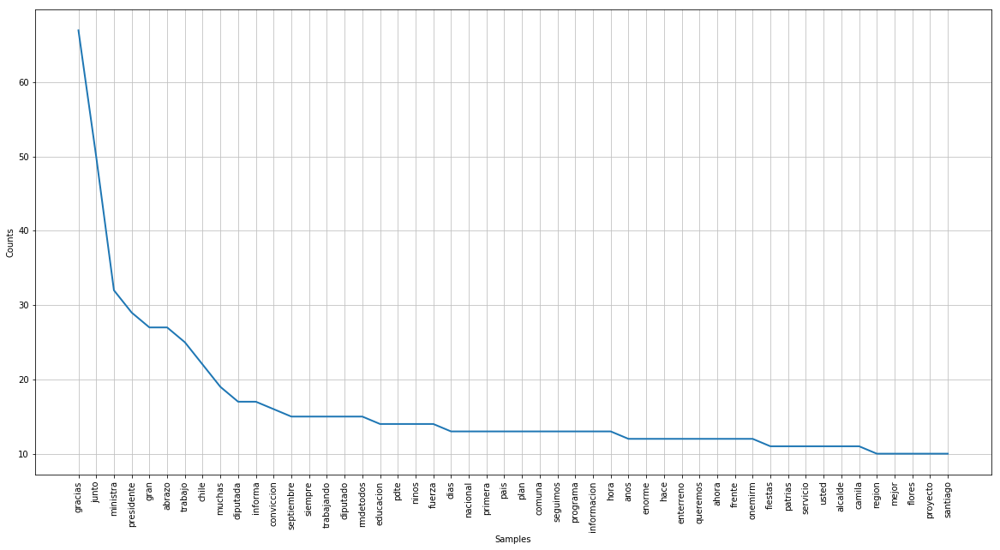

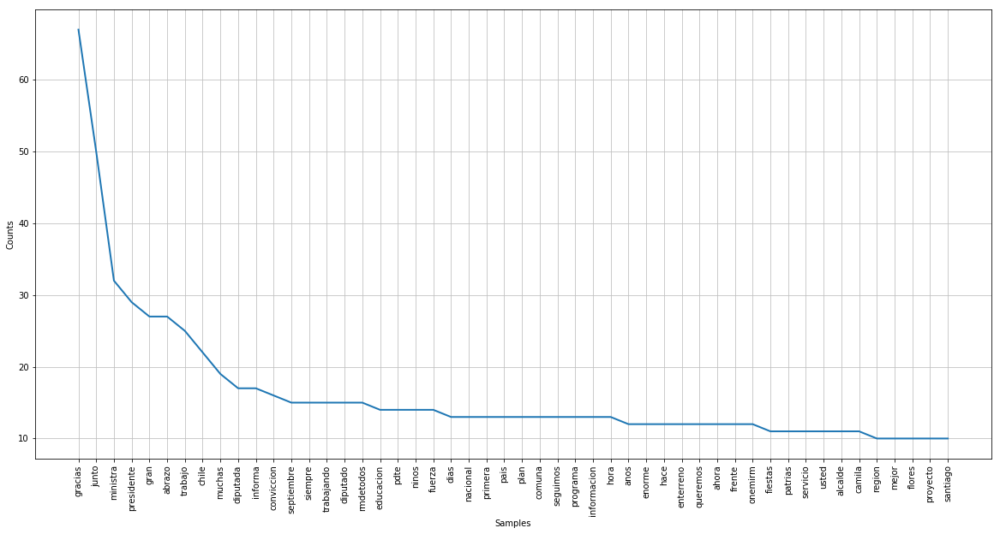

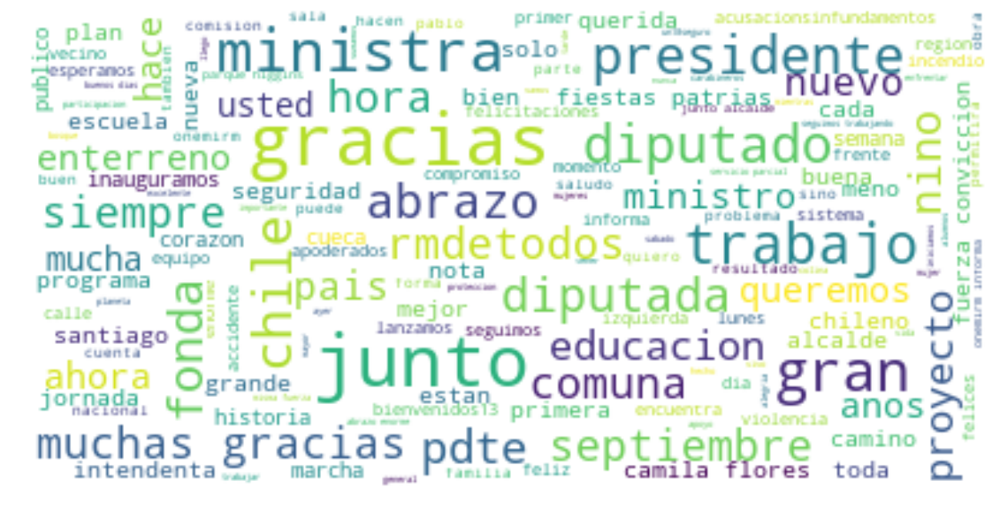

In [90]:
lista_chile_derecha_antes = []
lista_chile_derecha_antes = agregar_tweets_desde_archivo_a_lista("sebastianpinera.json", (2019,9,1), (2019,10, 1), lista_chile_derecha_antes)
lista_chile_derecha_antes = agregar_tweets_desde_archivo_a_lista("joseantoniokast.json", (2019,9,1), (2019,10, 1), lista_chile_derecha_antes)
lista_chile_derecha_antes = agregar_tweets_desde_archivo_a_lista("AlessandriFelip.json", (2019,9,1), (2019,10, 1), lista_chile_derecha_antes)
lista_chile_derecha_antes = agregar_tweets_desde_archivo_a_lista("desbordes.json", (2019,9,1), (2019,10, 1), lista_chile_derecha_antes)

lista_chile_derecha_antes = agregar_tweets_desde_archivo_a_lista("KarlaEnAccion.json", (2019,9,1), (2019,10, 1), lista_chile_derecha_antes)
lista_chile_derecha_antes = agregar_tweets_desde_archivo_a_lista("Cami_FloresO.json", (2019,9,1), (2019,10, 1), lista_chile_derecha_antes)
lista_chile_derecha_antes = agregar_tweets_desde_archivo_a_lista("jvanbiobio.json", (2019,9,1), (2019,10, 1), lista_chile_derecha_antes)
lista_chile_derecha_antes = agregar_tweets_desde_archivo_a_lista("paulinanu.json", (2019,9,1), (2019,10, 1), lista_chile_derecha_antes)
lista_chile_derecha_antes = agregar_tweets_desde_archivo_a_lista("mcubillossigall.json", (2019,9,1), (2019,10, 1), lista_chile_derecha_antes)

tweets_normalizados = normalizar_tweets_desde_lista(lista_chile_derecha_antes)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

plot_freq_dist_palabras(palabras_en_tweets, "chile/freq_dist/derecha_antes.png")
wordcloud_tweets(palabras_en_tweets, "chile/wordcloud/derecha_antes.png")


Tweets agregados. Cantidad de tweets en la lista:  62
Tweets agregados. Cantidad de tweets en la lista:  474
Tweets agregados. Cantidad de tweets en la lista:  580
Tweets agregados. Cantidad de tweets en la lista:  700
Tweets agregados. Cantidad de tweets en la lista:  1022
Tweets agregados. Cantidad de tweets en la lista:  1082
Tweets agregados. Cantidad de tweets en la lista:  1109
Tweets agregados. Cantidad de tweets en la lista:  1165
Tweets agregados. Cantidad de tweets en la lista:  1292
Tweets normalizados
Tweets tokenizados
<FreqDist with 3806 samples and 10247 outcomes>


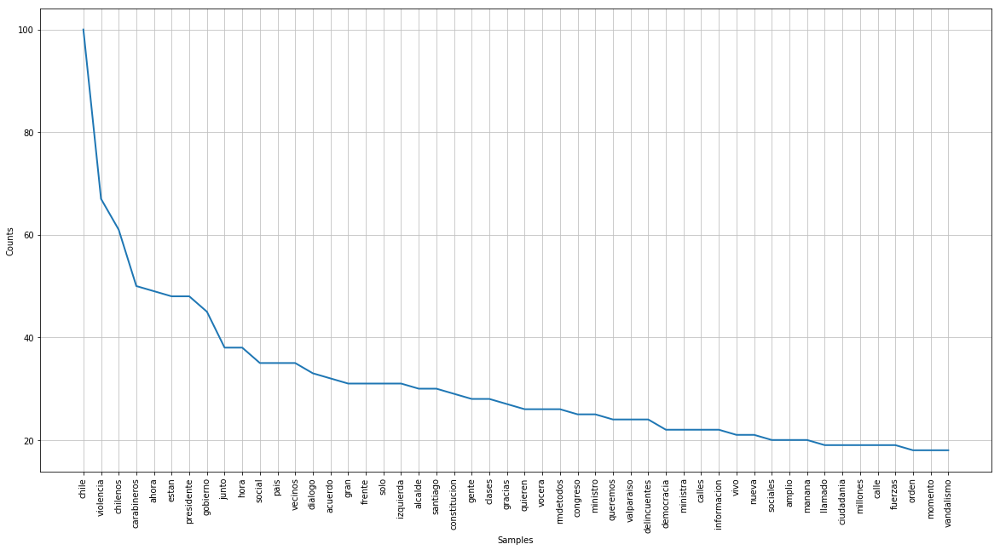

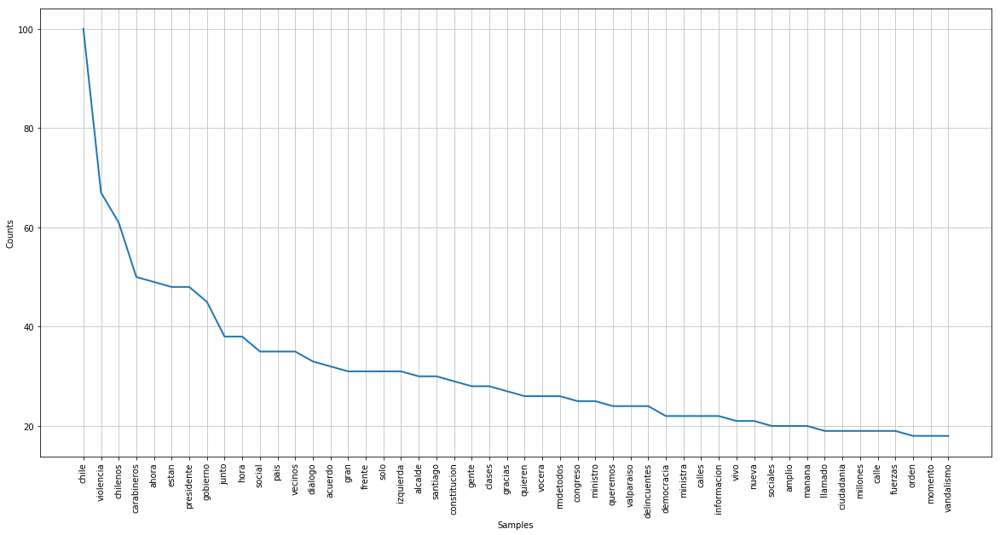

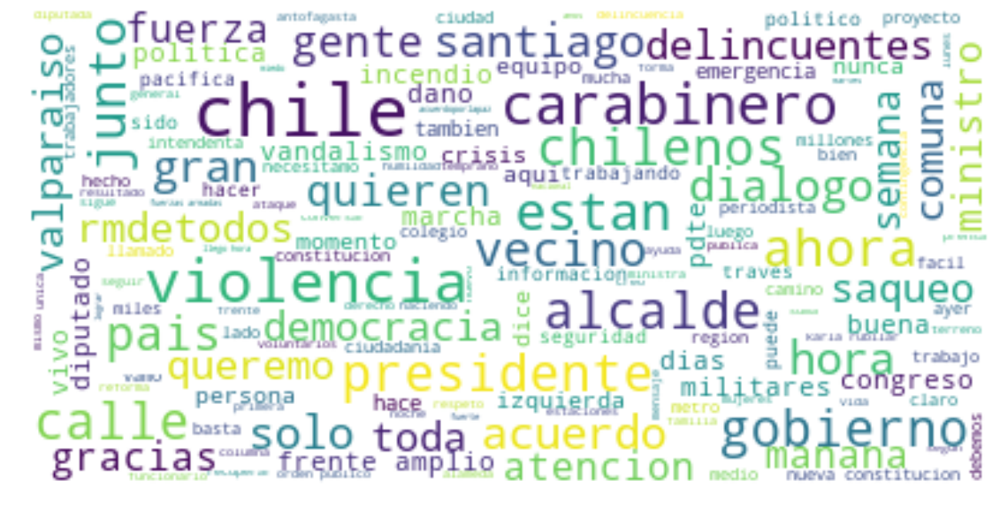

In [91]:
lista_chile_derecha_durante = []
lista_chile_derecha_durante = agregar_tweets_desde_archivo_a_lista("sebastianpinera.json", (2019,10,18), (2019,11, 18), lista_chile_derecha_durante)
lista_chile_derecha_durante = agregar_tweets_desde_archivo_a_lista("joseantoniokast.json", (2019,10,18), (2019,11, 18), lista_chile_derecha_durante)
lista_chile_derecha_durante = agregar_tweets_desde_archivo_a_lista("AlessandriFelip.json", (2019,10,18), (2019,11, 18), lista_chile_derecha_durante)
lista_chile_derecha_durante = agregar_tweets_desde_archivo_a_lista("desbordes.json", (2019,10,18), (2019,11, 18), lista_chile_derecha_durante)

lista_chile_derecha_durante = agregar_tweets_desde_archivo_a_lista("KarlaEnAccion.json", (2019,10,18), (2019,11, 18), lista_chile_derecha_durante)
lista_chile_derecha_durante = agregar_tweets_desde_archivo_a_lista("Cami_FloresO.json", (2019,10,18), (2019,11, 18), lista_chile_derecha_durante)
lista_chile_derecha_durante = agregar_tweets_desde_archivo_a_lista("jvanbiobio.json", (2019,10,18), (2019,11, 18), lista_chile_derecha_durante)
lista_chile_derecha_durante = agregar_tweets_desde_archivo_a_lista("paulinanu.json", (2019,10,18), (2019,11, 18), lista_chile_derecha_durante)
lista_chile_derecha_durante = agregar_tweets_desde_archivo_a_lista("mcubillossigall.json", (2019,10,18), (2019,11, 18), lista_chile_derecha_durante)

tweets_normalizados = normalizar_tweets_desde_lista(lista_chile_derecha_durante)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

plot_freq_dist_palabras(palabras_en_tweets, "chile/freq_dist/derecha_durante.png")
wordcloud_tweets(palabras_en_tweets, "chile/wordcloud/derecha_durante.png")

Tweets agregados. Cantidad de tweets en la lista:  87
Tweets agregados. Cantidad de tweets en la lista:  686
Tweets agregados. Cantidad de tweets en la lista:  867
Tweets agregados. Cantidad de tweets en la lista:  1029
Tweets agregados. Cantidad de tweets en la lista:  1561
Tweets agregados. Cantidad de tweets en la lista:  1716
Tweets agregados. Cantidad de tweets en la lista:  1824
Tweets agregados. Cantidad de tweets en la lista:  1895
Tweets agregados. Cantidad de tweets en la lista:  2290
Tweets normalizados
Tweets tokenizados
<FreqDist with 5904 samples and 18178 outcomes>


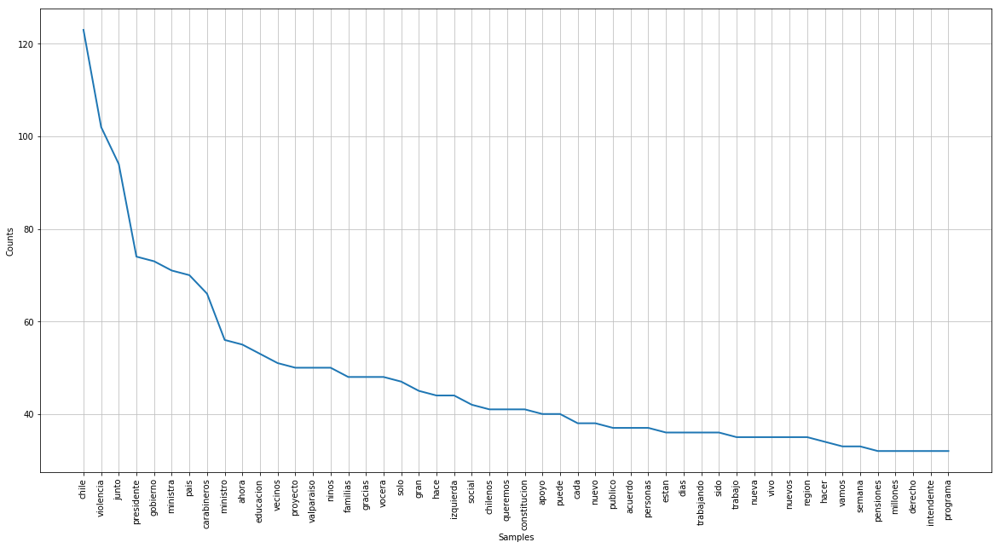

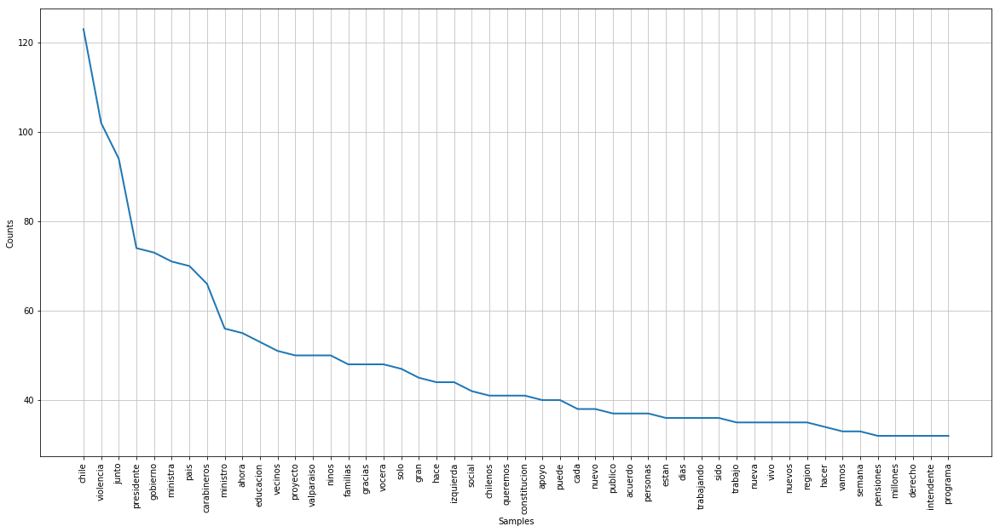

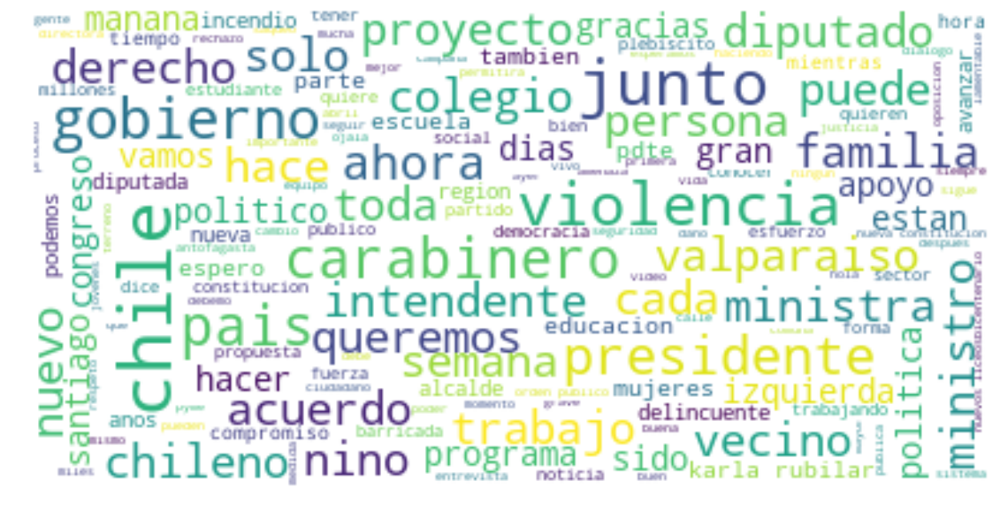

In [92]:
lista_chile_derecha_despues = []
lista_chile_derecha_despues = agregar_tweets_desde_archivo_a_lista("sebastianpinera.json", (2019,11,19), (2020,11, 18), lista_chile_derecha_despues)
lista_chile_derecha_despues = agregar_tweets_desde_archivo_a_lista("joseantoniokast.json", (2019,11,19), (2020,11, 18), lista_chile_derecha_despues)
lista_chile_derecha_despues = agregar_tweets_desde_archivo_a_lista("AlessandriFelip.json", (2019,11,19), (2020,11, 18), lista_chile_derecha_despues)
lista_chile_derecha_despues = agregar_tweets_desde_archivo_a_lista("desbordes.json", (2019,11,19), (2020,11, 18), lista_chile_derecha_despues)

lista_chile_derecha_despues = agregar_tweets_desde_archivo_a_lista("KarlaEnAccion.json", (2019,11,19), (2020,11, 18), lista_chile_derecha_despues)
lista_chile_derecha_despues = agregar_tweets_desde_archivo_a_lista("Cami_FloresO.json", (2019,11,19), (2020,11, 18), lista_chile_derecha_despues)
lista_chile_derecha_despues = agregar_tweets_desde_archivo_a_lista("jvanbiobio.json", (2019,11,19), (2020,11, 18), lista_chile_derecha_despues)
lista_chile_derecha_despues = agregar_tweets_desde_archivo_a_lista("paulinanu.json", (2019,11,19), (2020,11, 18), lista_chile_derecha_despues)
lista_chile_derecha_despues = agregar_tweets_desde_archivo_a_lista("mcubillossigall.json", (2019,11,19), (2020,11, 18), lista_chile_derecha_despues)

tweets_normalizados = normalizar_tweets_desde_lista(lista_chile_derecha_despues)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

plot_freq_dist_palabras(palabras_en_tweets, "chile/freq_dist/derecha_despues.png")
wordcloud_tweets(palabras_en_tweets, "chile/wordcloud/derecha_despues.png")

In [93]:
#Chile izquierda:
obtener_tweets("KarolCariola", "KarolCariola.json", (2019,9,1), (2020,2,1))
obtener_tweets("camila_vallejo", "camila_vallejo.json", (2019,9,1), (2020,2,1))
obtener_tweets("Claudia_Mix", "Claudia_Mix.json", (2019,9,1), (2020,2,1))
obtener_tweets("PamJiles", "PamJiles.json", (2019,9,1), (2020,2,1))

obtener_tweets("gabrielboric", "gabrielboric.json", (2019,9,1), (2020,2,1))
obtener_tweets("GiorgioJackson", "GiorgioJackson.json", (2019,9,1), (2020,2,1))
obtener_tweets("florcitamotuda", "florcitamotuda.json", (2019,9,1), (2020,2,1))
obtener_tweets("danieljadue", "danieljadue.json", (2019,9,1), (2020,2,1))
obtener_tweets("marcoporchile", "marcoporchile.json", (2019,9,1), (2020,2,1))

Last Tweet @ 2020-03-09 12:23:48  - fetching some more
Last Tweet @ 2020-03-06 13:42:54  - fetching some more
Last Tweet @ 2020-03-03 17:57:21  - fetching some more
Last Tweet @ 2020-03-02 17:33:42  - fetching some more
Last Tweet @ 2020-03-02 10:55:07  - fetching some more
Last Tweet @ 2020-02-24 03:41:53  - fetching some more
Last Tweet @ 2020-02-21 16:39:17  - fetching some more
Last Tweet @ 2020-02-02 21:39:55  - fetching some more
Last Tweet @ 2020-01-30 00:30:45  - fetching some more
Last Tweet @ 2020-01-25 01:29:18  - fetching some more
Last Tweet @ 2020-01-22 03:08:02  - fetching some more
Last Tweet @ 2020-01-14 17:51:07  - fetching some more
Last Tweet @ 2020-01-10 18:07:38  - fetching some more
Last Tweet @ 2020-01-07 21:17:01  - fetching some more
Last Tweet @ 2020-01-02 21:27:22  - fetching some more
Last Tweet @ 2019-12-30 17:18:22  - fetching some more
Last Tweet @ 2019-12-28 19:12:40  - fetching some more
Last Tweet @ 2019-12-28 14:23:01  - fetching some more
Last Tweet

Last Tweet @ 2020-03-04 17:06:14  - fetching some more
Last Tweet @ 2020-03-04 01:53:27  - fetching some more
Last Tweet @ 2020-03-02 02:27:14  - fetching some more
Last Tweet @ 2020-02-25 03:19:54  - fetching some more
Last Tweet @ 2020-02-07 19:53:10  - fetching some more
Last Tweet @ 2020-01-29 13:30:12  - fetching some more
Last Tweet @ 2020-01-23 20:22:05  - fetching some more
Last Tweet @ 2020-01-21 12:16:07  - fetching some more
Last Tweet @ 2020-01-15 21:47:39  - fetching some more
Last Tweet @ 2020-01-11 23:28:54  - fetching some more
Last Tweet @ 2020-01-07 23:39:54  - fetching some more
Last Tweet @ 2020-01-02 14:44:33  - fetching some more
Last Tweet @ 2019-12-27 15:26:20  - fetching some more
Last Tweet @ 2019-12-23 14:33:37  - fetching some more
Last Tweet @ 2019-12-20 00:42:47  - fetching some more
Last Tweet @ 2019-12-18 18:32:55  - fetching some more
Last Tweet @ 2019-12-18 02:42:13  - fetching some more
Last Tweet @ 2019-12-16 04:10:05  - fetching some more
Last Tweet

Last Tweet @ 2019-12-23 14:42:52  - fetching some more
Last Tweet @ 2019-12-23 01:12:55  - fetching some more
Last Tweet @ 2019-12-22 23:49:02  - fetching some more
Last Tweet @ 2019-12-22 22:39:21  - fetching some more
Last Tweet @ 2019-12-22 20:47:23  - fetching some more
Last Tweet @ 2019-12-22 16:21:03  - fetching some more
Last Tweet @ 2019-12-22 15:35:41  - fetching some more
Last Tweet @ 2019-12-22 15:22:11  - fetching some more
Last Tweet @ 2019-12-21 21:38:19  - fetching some more
Last Tweet @ 2019-12-21 16:04:21  - fetching some more
Last Tweet @ 2019-12-21 02:23:15  - fetching some more
Last Tweet @ 2019-12-21 02:18:00  - fetching some more
Last Tweet @ 2019-12-21 01:59:32  - fetching some more
Last Tweet @ 2019-12-21 00:33:31  - fetching some more
Last Tweet @ 2019-12-20 01:13:52  - fetching some more
Last Tweet @ 2019-12-19 20:33:37  - fetching some more
Last Tweet @ 2019-12-19 14:09:42  - fetching some more
Last Tweet @ 2019-12-19 00:44:12  - fetching some more
Last Tweet

IndexError: list index out of range

In [94]:
obtener_tweets("gabrielboric", "gabrielboric.json", (2019,9,1), (2020,2,1))
obtener_tweets("GiorgioJackson", "GiorgioJackson.json", (2019,9,1), (2020,2,1))
obtener_tweets("florcitamotuda", "florcitamotuda.json", (2019,9,1), (2020,2,1))
obtener_tweets("danieljadue", "danieljadue.json", (2019,9,1), (2020,2,1))
obtener_tweets("marcoporchile", "marcoporchile.json", (2019,9,1), (2020,2,1))

Last Tweet @ 2020-03-09 02:16:48  - fetching some more
Last Tweet @ 2020-03-07 19:07:08  - fetching some more
Last Tweet @ 2020-03-06 15:22:31  - fetching some more
Last Tweet @ 2020-03-05 13:42:41  - fetching some more
Last Tweet @ 2020-03-04 17:33:08  - fetching some more
Last Tweet @ 2020-03-04 12:43:06  - fetching some more
Last Tweet @ 2020-03-03 16:48:29  - fetching some more
Last Tweet @ 2020-03-02 20:14:09  - fetching some more
Last Tweet @ 2020-03-01 19:00:41  - fetching some more
Last Tweet @ 2020-02-29 19:17:19  - fetching some more
Last Tweet @ 2020-02-28 17:05:19  - fetching some more
Last Tweet @ 2020-02-26 23:03:41  - fetching some more
Last Tweet @ 2020-02-15 22:33:24  - fetching some more
Last Tweet @ 2020-02-02 00:26:16  - fetching some more
Last Tweet @ 2020-01-30 22:05:37  - fetching some more
Last Tweet @ 2020-01-30 05:11:30  - fetching some more
Last Tweet @ 2020-01-29 19:25:54  - fetching some more
Last Tweet @ 2020-01-27 22:38:14  - fetching some more
Last Tweet

Last Tweet @ 2020-03-02 21:32:34  - fetching some more
Last Tweet @ 2020-03-02 14:35:27  - fetching some more
Last Tweet @ 2020-03-02 01:15:02  - fetching some more
Last Tweet @ 2020-02-28 21:06:24  - fetching some more
Last Tweet @ 2020-02-28 00:26:45  - fetching some more
Last Tweet @ 2020-02-26 11:32:27  - fetching some more
Last Tweet @ 2020-02-22 19:36:11  - fetching some more
Last Tweet @ 2020-02-13 21:34:58  - fetching some more
Last Tweet @ 2020-01-31 23:55:33  - fetching some more
Last Tweet @ 2020-01-30 18:23:16  - fetching some more
Last Tweet @ 2020-01-29 20:04:58  - fetching some more
Last Tweet @ 2020-01-28 14:11:18  - fetching some more
Last Tweet @ 2020-01-24 14:13:31  - fetching some more
Last Tweet @ 2020-01-23 14:51:46  - fetching some more
Last Tweet @ 2020-01-22 19:21:10  - fetching some more
Last Tweet @ 2020-01-22 04:44:40  - fetching some more
Last Tweet @ 2020-01-21 16:45:39  - fetching some more
Last Tweet @ 2020-01-20 14:35:19  - fetching some more
Last Tweet

Last Tweet @ 2019-10-29 12:47:43  - fetching some more
Last Tweet @ 2019-10-28 10:01:09  - fetching some more
Last Tweet @ 2019-10-27 10:09:02  - fetching some more
Last Tweet @ 2019-10-27 09:05:58  - fetching some more
Last Tweet @ 2019-10-26 03:48:24  - fetching some more
Last Tweet @ 2019-10-24 17:15:10  - fetching some more
Last Tweet @ 2019-10-23 07:42:36  - fetching some more
Last Tweet @ 2019-10-23 07:25:31  - fetching some more
Last Tweet @ 2019-10-23 07:00:16  - fetching some more
Last Tweet @ 2019-10-23 05:11:34  - fetching some more
Last Tweet @ 2019-10-23 05:03:57  - fetching some more
Last Tweet @ 2019-10-23 04:57:39  - fetching some more
Last Tweet @ 2019-10-23 04:51:32  - fetching some more
Last Tweet @ 2019-10-23 03:23:57  - fetching some more
Last Tweet @ 2019-10-22 22:52:05  - fetching some more
Last Tweet @ 2019-10-21 04:41:44  - fetching some more
Last Tweet @ 2019-10-20 07:27:04  - fetching some more
Last Tweet @ 2019-10-19 23:42:02  - fetching some more
Last Tweet

Tweets agregados. Cantidad de tweets en la lista:  223
Tweets agregados. Cantidad de tweets en la lista:  410
Tweets agregados. Cantidad de tweets en la lista:  609
Tweets agregados. Cantidad de tweets en la lista:  896
Tweets agregados. Cantidad de tweets en la lista:  1158
Tweets agregados. Cantidad de tweets en la lista:  1296
Tweets agregados. Cantidad de tweets en la lista:  1478
Tweets agregados. Cantidad de tweets en la lista:  1490
Tweets normalizados
Tweets tokenizados
<FreqDist with 4831 samples and 11457 outcomes>


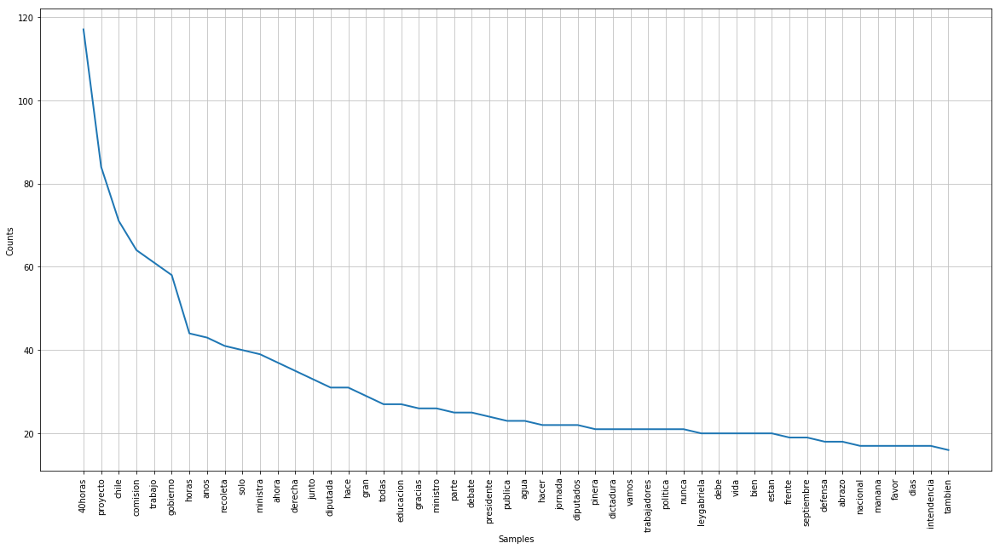

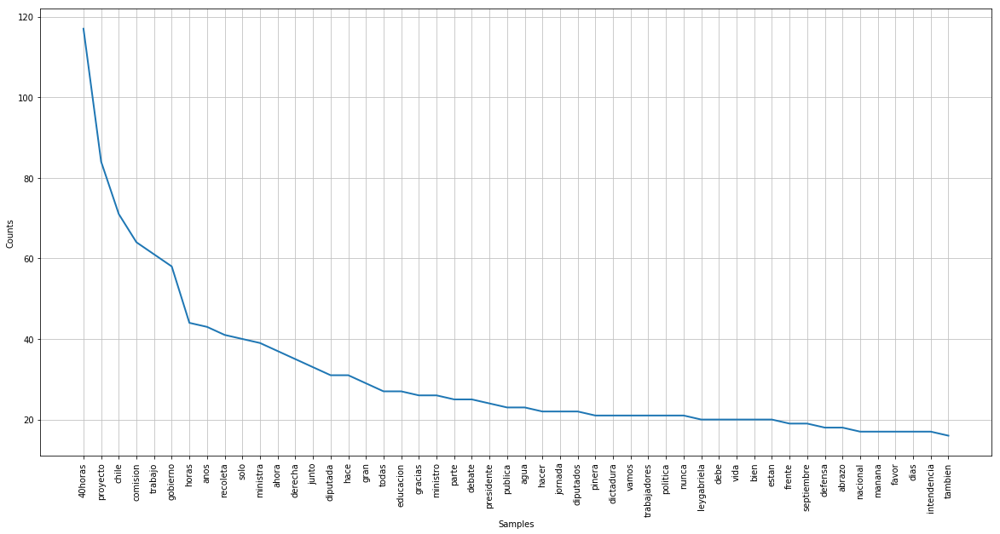

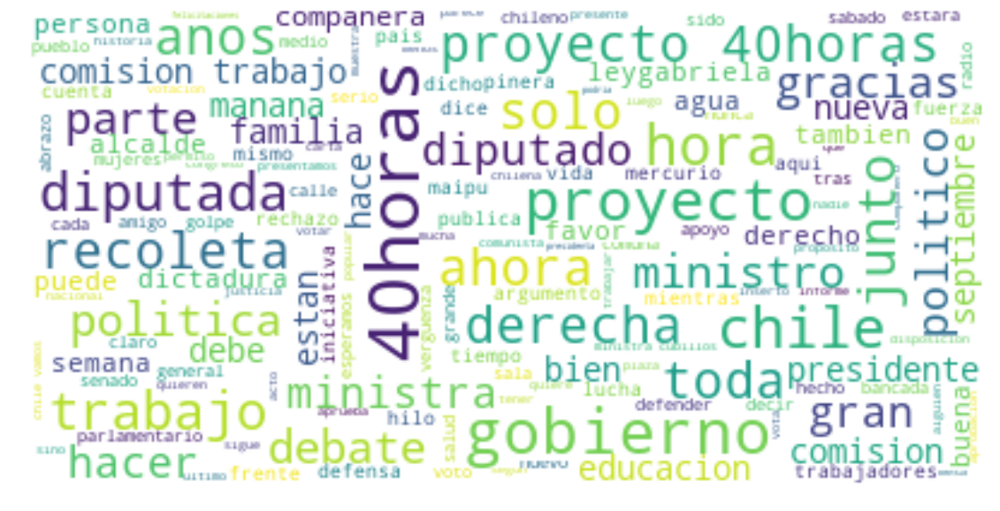

In [95]:
lista_chile_izquierda_antes = []
lista_chile_izquierda_antes = agregar_tweets_desde_archivo_a_lista("KarolCariola.json", (2019,9,1), (2019,10, 1), lista_chile_izquierda_antes)
lista_chile_izquierda_antes = agregar_tweets_desde_archivo_a_lista("camila_vallejo.json", (2019,9,1), (2019,10, 1), lista_chile_izquierda_antes)
lista_chile_izquierda_antes = agregar_tweets_desde_archivo_a_lista("Claudia_Mix.json", (2019,9,1), (2019,10, 1), lista_chile_izquierda_antes)

lista_chile_izquierda_antes = agregar_tweets_desde_archivo_a_lista("gabrielboric.json", (2019,9,1), (2019,10, 1), lista_chile_izquierda_antes)
lista_chile_izquierda_antes = agregar_tweets_desde_archivo_a_lista("GiorgioJackson.json", (2019,9,1), (2019,10, 1), lista_chile_izquierda_antes)
lista_chile_izquierda_antes = agregar_tweets_desde_archivo_a_lista("florcitamotuda.json", (2019,9,1), (2019,10, 1), lista_chile_izquierda_antes)
lista_chile_izquierda_antes = agregar_tweets_desde_archivo_a_lista("danieljadue.json", (2019,9,1), (2019,10, 1), lista_chile_izquierda_antes)
lista_chile_izquierda_antes = agregar_tweets_desde_archivo_a_lista("marcoporchile.json", (2019,9,1), (2019,10, 1), lista_chile_izquierda_antes)

tweets_normalizados = normalizar_tweets_desde_lista(lista_chile_izquierda_antes)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

plot_freq_dist_palabras(palabras_en_tweets, "chile/freq_dist/izquierda_antes.png")
wordcloud_tweets(palabras_en_tweets, "chile/wordcloud/izquierda_antes.png")


In [ ]:
lista_chile_izquierda_durante = []
lista_chile_izquierda_durante = agregar_tweets_desde_archivo_a_lista("KarolCariola.json", (2019,10,18), (2019,11, 18), lista_chile_izquierda_durante)
lista_chile_izquierda_durante = agregar_tweets_desde_archivo_a_lista("camila_vallejo.json", (2019,10,18), (2019,11, 18), lista_chile_izquierda_durante)
lista_chile_izquierda_durante = agregar_tweets_desde_archivo_a_lista("Claudia_Mix.json", (2019,10,18), (2019,11, 18), lista_chile_izquierda_durante)

lista_chile_izquierda_durante = agregar_tweets_desde_archivo_a_lista("gabrielboric.json", (2019,10,18), (2019,11, 18), lista_chile_izquierda_durante)
lista_chile_izquierda_durante = agregar_tweets_desde_archivo_a_lista("GiorgioJackson.json", (2019,10,18), (2019,11, 18), lista_chile_izquierda_durante)
lista_chile_izquierda_durante = agregar_tweets_desde_archivo_a_lista("florcitamotuda.json", (2019,10,18), (2019,11, 18), lista_chile_izquierda_durante)
lista_chile_izquierda_durante = agregar_tweets_desde_archivo_a_lista("danieljadue.json", (2019,10,18), (2019,11, 18), lista_chile_izquierda_durante)
lista_chile_izquierda_durante = agregar_tweets_desde_archivo_a_lista("marcoporchile.json", (2019,10,18), (2019,11, 18), lista_chile_izquierda_durante)

tweets_normalizados = normalizar_tweets_desde_lista(lista_chile_izquierda_durante)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

plot_freq_dist_palabras(palabras_en_tweets, "chile/freq_dist/izquierda_durante.png")
wordcloud_tweets(palabras_en_tweets, "chile/wordcloud/izquierda_durante.png")


Tweets agregados. Cantidad de tweets en la lista:  604
Tweets agregados. Cantidad de tweets en la lista:  1070
Tweets agregados. Cantidad de tweets en la lista:  1518
Tweets agregados. Cantidad de tweets en la lista:  2872
Tweets agregados. Cantidad de tweets en la lista:  3947
Tweets agregados. Cantidad de tweets en la lista:  4236
Tweets agregados. Cantidad de tweets en la lista:  4735
Tweets agregados. Cantidad de tweets en la lista:  4920
Tweets normalizados
Tweets tokenizados
<FreqDist with 9877 samples and 37048 outcomes>


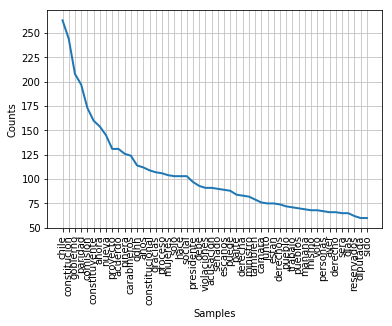

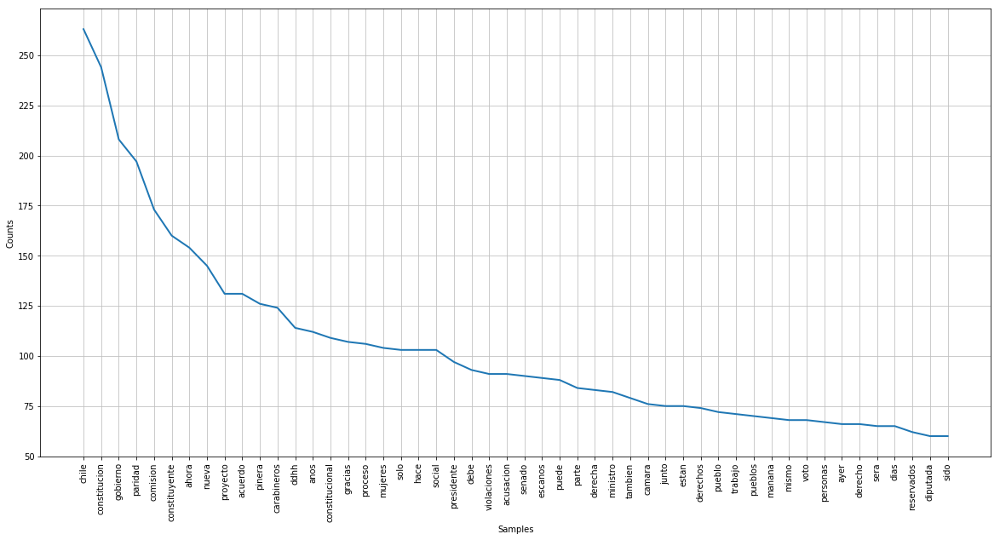

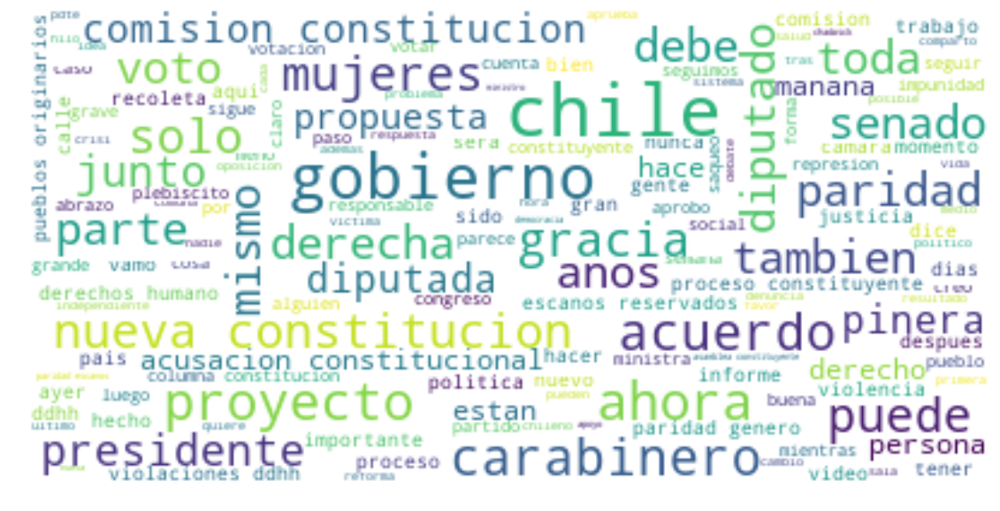

In [9]:
lista_chile_izquierda_despues = []
lista_chile_izquierda_despues = agregar_tweets_desde_archivo_a_lista("KarolCariola.json", (2019,11,18), (2020,11,18), lista_chile_izquierda_despues)
lista_chile_izquierda_despues = agregar_tweets_desde_archivo_a_lista("camila_vallejo.json", (2019,11,18), (2020,11,18), lista_chile_izquierda_despues)
lista_chile_izquierda_despues = agregar_tweets_desde_archivo_a_lista("Claudia_Mix.json", (2019,11,18), (2020,11,18), lista_chile_izquierda_despues)

lista_chile_izquierda_despues = agregar_tweets_desde_archivo_a_lista("gabrielboric.json", (2019,11,18), (2020,11,18), lista_chile_izquierda_despues)
lista_chile_izquierda_despues = agregar_tweets_desde_archivo_a_lista("GiorgioJackson.json", (2019,11,18), (2020,11,18), lista_chile_izquierda_despues)
lista_chile_izquierda_despues = agregar_tweets_desde_archivo_a_lista("florcitamotuda.json", (2019,11,18), (2020,11,18), lista_chile_izquierda_despues)
lista_chile_izquierda_despues = agregar_tweets_desde_archivo_a_lista("danieljadue.json", (2019,11,18), (2020,11,18), lista_chile_izquierda_despues)
lista_chile_izquierda_despues = agregar_tweets_desde_archivo_a_lista("marcoporchile.json", (2019,11,18), (2020,11,18), lista_chile_izquierda_despues)

tweets_normalizados = normalizar_tweets_desde_lista(lista_chile_izquierda_despues)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

plot_freq_dist_palabras(palabras_en_tweets, "chile/freq_dist/izquierda_despues.png")
wordcloud_tweets(palabras_en_tweets, "chile/wordcloud/izquierda_despues.png")

Tweets agregados. Cantidad de tweets en la lista:  223
Tweets agregados. Cantidad de tweets en la lista:  410
Tweets agregados. Cantidad de tweets en la lista:  609
Tweets agregados. Cantidad de tweets en la lista:  844
Tweets agregados. Cantidad de tweets en la lista:  904
Tweets agregados. Cantidad de tweets en la lista:  944
Tweets agregados. Cantidad de tweets en la lista:  986
Tweets agregados. Cantidad de tweets en la lista:  1059
Tweets agregados. Cantidad de tweets en la lista:  1065
Tweets agregados. Cantidad de tweets en la lista:  1115
Tweets agregados. Cantidad de tweets en la lista:  1169
Tweets agregados. Cantidad de tweets en la lista:  1233
Tweets agregados. Cantidad de tweets en la lista:  1348
Tweets normalizados
Tweets tokenizados
<FreqDist with 4306 samples and 10679 outcomes>


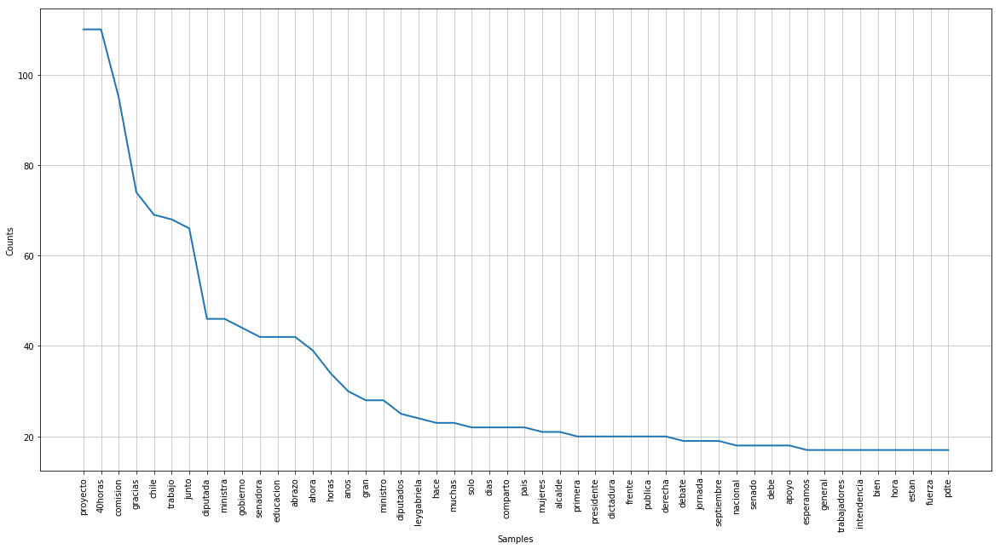

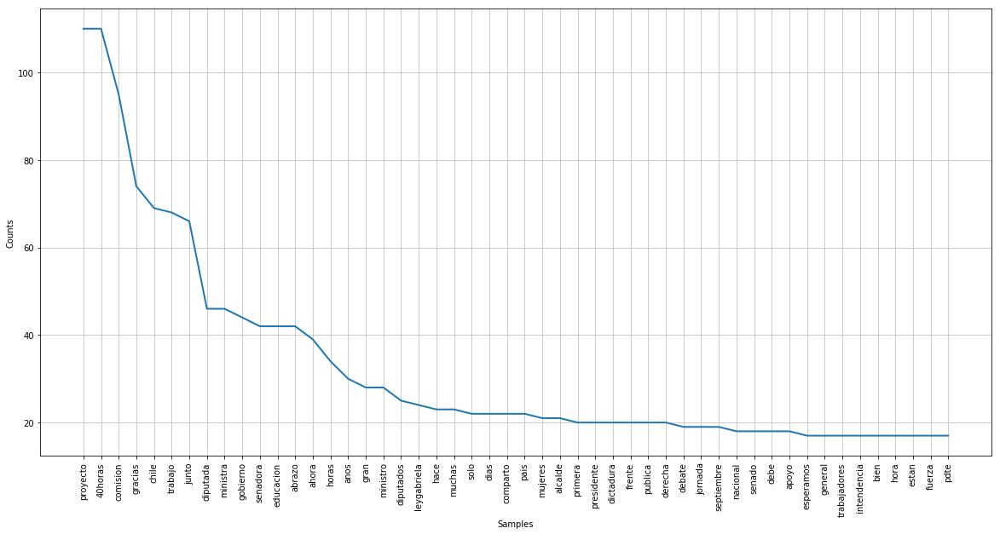

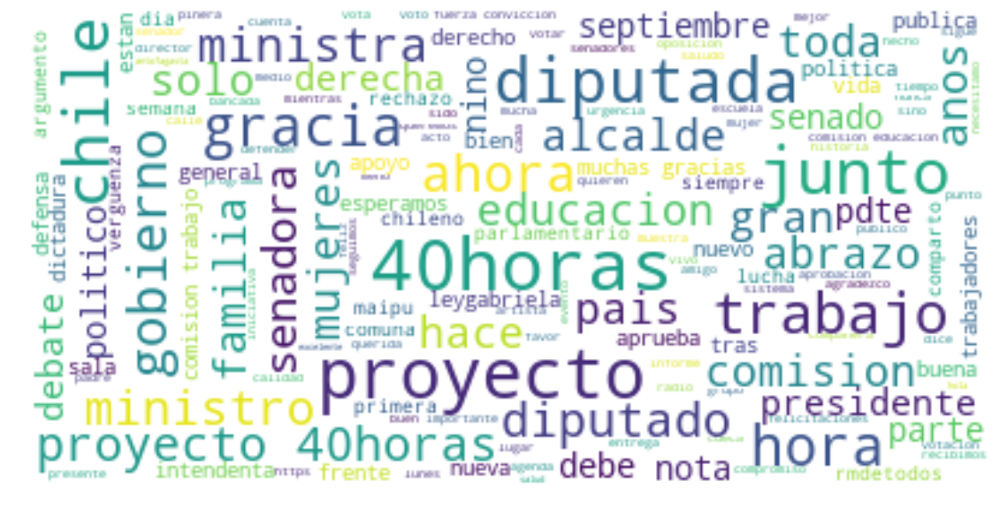

In [24]:
lista_chile_mujeres_antes = []
lista_chile_mujeres_antes = agregar_tweets_desde_archivo_a_lista("KarolCariola.json", (2019,9,1), (2019,10, 1), lista_chile_mujeres_antes)
lista_chile_mujeres_antes = agregar_tweets_desde_archivo_a_lista("camila_vallejo.json", (2019,9,1), (2019,10, 1), lista_chile_mujeres_antes)
lista_chile_mujeres_antes = agregar_tweets_desde_archivo_a_lista("Claudia_Mix.json", (2019,9,1), (2019,10, 1), lista_chile_mujeres_antes)

lista_chile_mujeres_antes = agregar_tweets_desde_archivo_a_lista("KarlaEnAccion.json", (2019,9,1), (2019,10, 1), lista_chile_mujeres_antes)
lista_chile_mujeres_antes = agregar_tweets_desde_archivo_a_lista("Cami_FloresO.json", (2019,9,1), (2019,10, 1), lista_chile_mujeres_antes)
lista_chile_mujeres_antes = agregar_tweets_desde_archivo_a_lista("jvanbiobio.json", (2019,9,1), (2019,10, 1), lista_chile_mujeres_antes)
lista_chile_mujeres_antes = agregar_tweets_desde_archivo_a_lista("paulinanu.json", (2019,9,1), (2019,10, 1), lista_chile_mujeres_antes)
lista_chile_mujeres_antes = agregar_tweets_desde_archivo_a_lista("mcubillossigall.json", (2019,9,1), (2019,10, 1), lista_chile_mujeres_antes)

lista_chile_mujeres_antes = agregar_tweets_desde_archivo_a_lista("mbachelet.json", (2019,9,1), (2019,10, 1), lista_chile_mujeres_antes)
lista_chile_mujeres_antes = agregar_tweets_desde_archivo_a_lista("MarcelaHernando.json", (2019,9,1), (2019,10, 1), lista_chile_mujeres_antes)
lista_chile_mujeres_antes = agregar_tweets_desde_archivo_a_lista("carolinagoic.json", (2019,9,1), (2019,10, 1), lista_chile_mujeres_antes)
lista_chile_mujeres_antes = agregar_tweets_desde_archivo_a_lista("ximenaordenes.json", (2019,9,1), (2019,10, 1), lista_chile_mujeres_antes)
lista_chile_mujeres_antes = agregar_tweets_desde_archivo_a_lista("ProvosteYasna.json", (2019,9,1), (2019,10, 1), lista_chile_mujeres_antes)

tweets_normalizados = normalizar_tweets_desde_lista(lista_chile_mujeres_antes)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

plot_freq_dist_palabras(palabras_en_tweets, "todos/freq_dist/mujeres_antes.png")
wordcloud_tweets(palabras_en_tweets, "todos/wordcloud/mujeres_antes.png")

Tweets agregados. Cantidad de tweets en la lista:  636
Tweets agregados. Cantidad de tweets en la lista:  993
Tweets agregados. Cantidad de tweets en la lista:  1272
Tweets agregados. Cantidad de tweets en la lista:  1594
Tweets agregados. Cantidad de tweets en la lista:  1654
Tweets agregados. Cantidad de tweets en la lista:  1681
Tweets agregados. Cantidad de tweets en la lista:  1737
Tweets agregados. Cantidad de tweets en la lista:  1864
Tweets agregados. Cantidad de tweets en la lista:  1870
Tweets agregados. Cantidad de tweets en la lista:  1959
Tweets agregados. Cantidad de tweets en la lista:  2037
Tweets agregados. Cantidad de tweets en la lista:  2087
Tweets agregados. Cantidad de tweets en la lista:  2257
Tweets normalizados
Tweets tokenizados
<FreqDist with 6129 samples and 19020 outcomes>


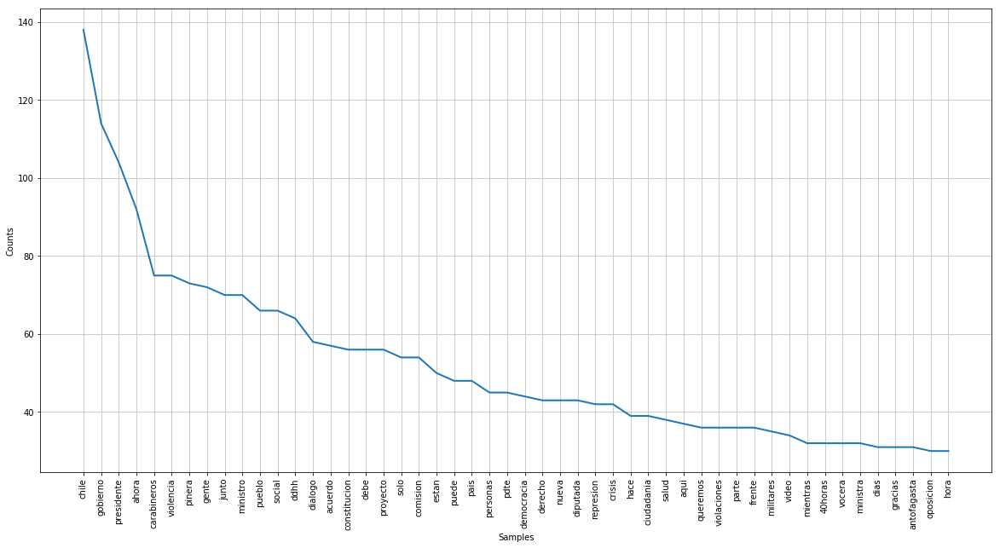

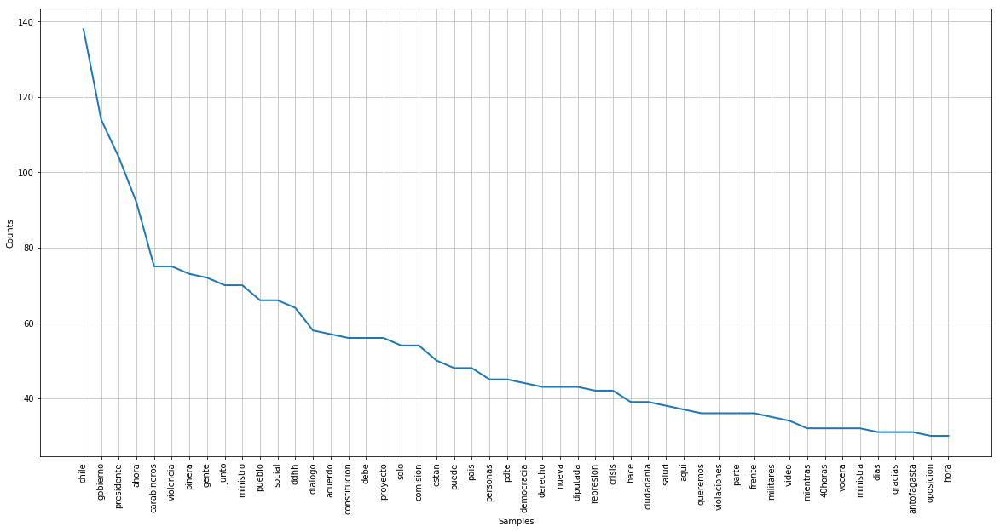

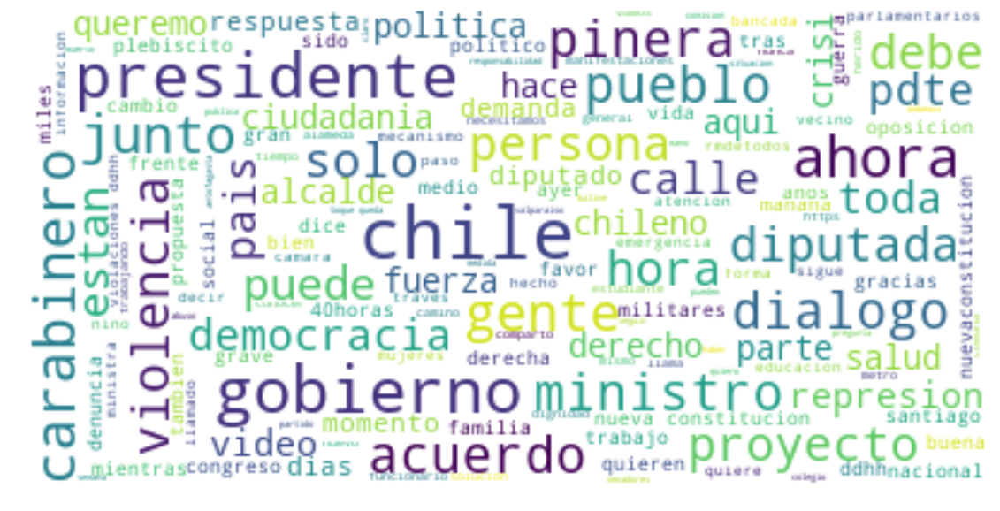

In [25]:
lista_chile_mujeres_durante = []
lista_chile_mujeres_durante = agregar_tweets_desde_archivo_a_lista("KarolCariola.json", (2019,10,18), (2019,11, 18), lista_chile_mujeres_durante)
lista_chile_mujeres_durante = agregar_tweets_desde_archivo_a_lista("camila_vallejo.json", (2019,10,18), (2019,11, 18), lista_chile_mujeres_durante)
lista_chile_mujeres_durante = agregar_tweets_desde_archivo_a_lista("Claudia_Mix.json", (2019,10,18), (2019,11, 18), lista_chile_mujeres_durante)

lista_chile_mujeres_durante = agregar_tweets_desde_archivo_a_lista("KarlaEnAccion.json", (2019,10,18), (2019,11, 18), lista_chile_mujeres_durante)
lista_chile_mujeres_durante = agregar_tweets_desde_archivo_a_lista("Cami_FloresO.json", (2019,10,18), (2019,11, 18), lista_chile_mujeres_durante)
lista_chile_mujeres_durante = agregar_tweets_desde_archivo_a_lista("jvanbiobio.json", (2019,10,18), (2019,11, 18), lista_chile_mujeres_durante)
lista_chile_mujeres_durante = agregar_tweets_desde_archivo_a_lista("paulinanu.json", (2019,10,18), (2019,11, 18), lista_chile_mujeres_durante)
lista_chile_mujeres_durante = agregar_tweets_desde_archivo_a_lista("mcubillossigall.json", (2019,10,18), (2019,11, 18), lista_chile_mujeres_durante)

lista_chile_mujeres_durante = agregar_tweets_desde_archivo_a_lista("mbachelet.json", (2019,10,18), (2019,11, 18), lista_chile_mujeres_durante)
lista_chile_mujeres_durante = agregar_tweets_desde_archivo_a_lista("MarcelaHernando.json", (2019,10,18), (2019,11, 18), lista_chile_mujeres_durante)
lista_chile_mujeres_durante = agregar_tweets_desde_archivo_a_lista("carolinagoic.json", (2019,10,18), (2019,11, 18), lista_chile_mujeres_durante)
lista_chile_mujeres_durante = agregar_tweets_desde_archivo_a_lista("ximenaordenes.json", (2019,10,18), (2019,11, 18), lista_chile_mujeres_durante)
lista_chile_mujeres_durante = agregar_tweets_desde_archivo_a_lista("ProvosteYasna.json", (2019,10,18), (2019,11, 18), lista_chile_mujeres_durante)

tweets_normalizados = normalizar_tweets_desde_lista(lista_chile_mujeres_durante)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

plot_freq_dist_palabras(palabras_en_tweets, "todos/freq_dist/mujeres_durante.png")
wordcloud_tweets(palabras_en_tweets, "todos/wordcloud/mujeres_durante.png")


Tweets agregados. Cantidad de tweets en la lista:  604
Tweets agregados. Cantidad de tweets en la lista:  1070
Tweets agregados. Cantidad de tweets en la lista:  1518
Tweets agregados. Cantidad de tweets en la lista:  1529
Tweets agregados. Cantidad de tweets en la lista:  1670
Tweets agregados. Cantidad de tweets en la lista:  1768
Tweets agregados. Cantidad de tweets en la lista:  1870
Tweets agregados. Cantidad de tweets en la lista:  2058
Tweets agregados. Cantidad de tweets en la lista:  2590
Tweets agregados. Cantidad de tweets en la lista:  2745
Tweets agregados. Cantidad de tweets en la lista:  2853
Tweets agregados. Cantidad de tweets en la lista:  2924
Tweets agregados. Cantidad de tweets en la lista:  3319
Tweets normalizados
Tweets tokenizados
<FreqDist with 7822 samples and 27179 outcomes>


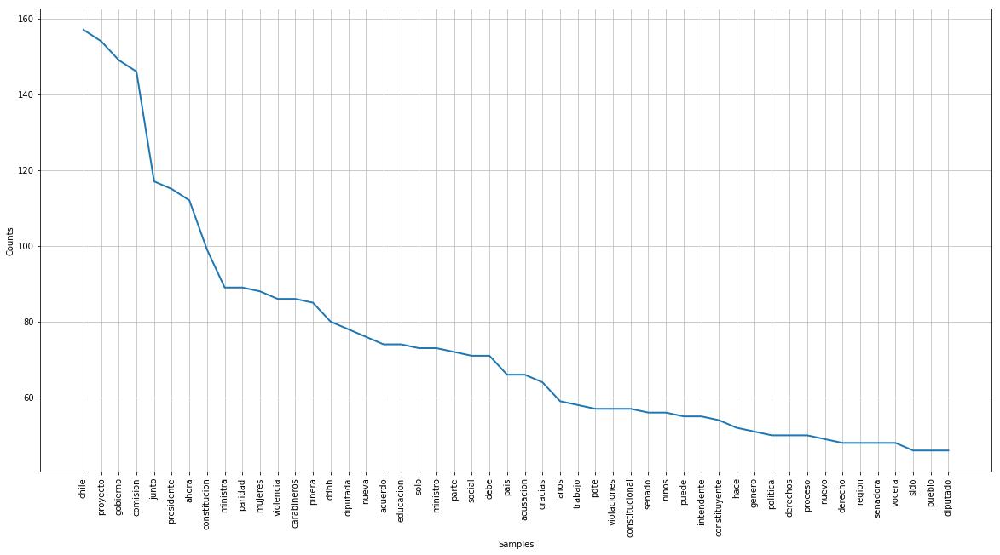

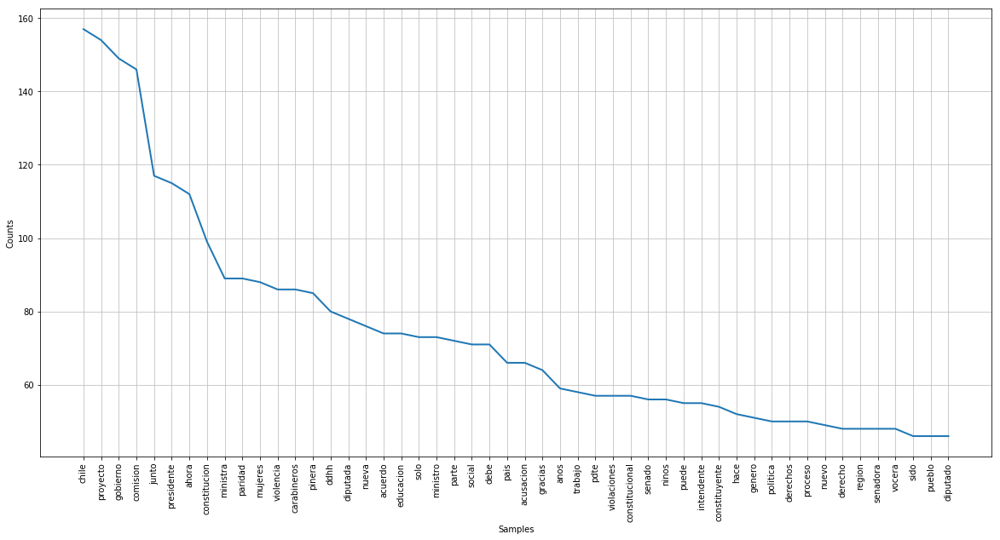

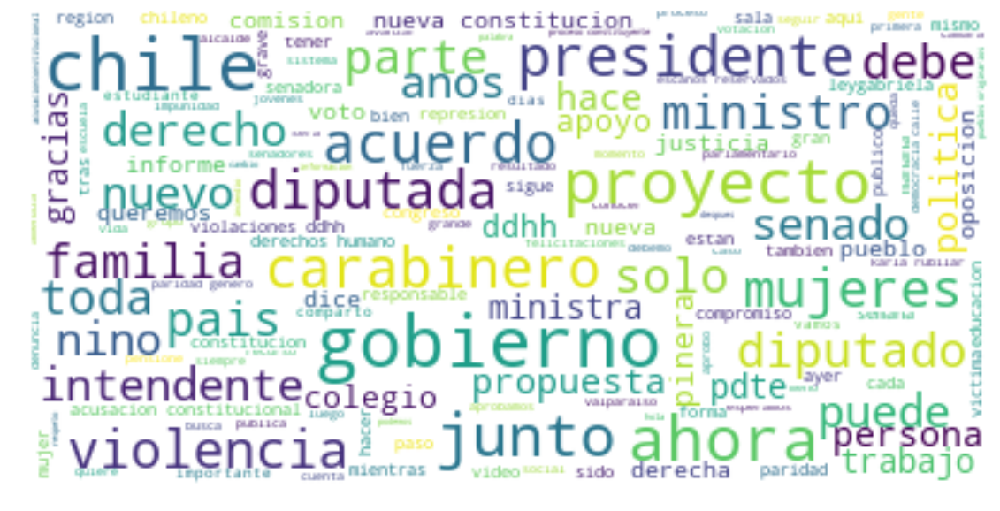

In [26]:
lista_chile_mujeres_despues = []
lista_chile_mujeres_despues = agregar_tweets_desde_archivo_a_lista("KarolCariola.json", (2019,11,18), (2020,11,18), lista_chile_mujeres_despues)
lista_chile_mujeres_despues = agregar_tweets_desde_archivo_a_lista("camila_vallejo.json", (2019,11,18), (2020,11,18), lista_chile_mujeres_despues)
lista_chile_mujeres_despues = agregar_tweets_desde_archivo_a_lista("Claudia_Mix.json", (2019,11,18), (2020,11,18), lista_chile_mujeres_despues)

lista_chile_mujeres_despues = agregar_tweets_desde_archivo_a_lista("mbachelet.json", (2019,11,18), (2020,11, 18), lista_chile_mujeres_despues)
lista_chile_mujeres_despues = agregar_tweets_desde_archivo_a_lista("MarcelaHernando.json", (2019,11,18), (2020,11, 18), lista_chile_mujeres_despues)
lista_chile_mujeres_despues = agregar_tweets_desde_archivo_a_lista("carolinagoic.json", (2019,11,18), (2020,11, 18), lista_chile_mujeres_despues)
lista_chile_mujeres_despues = agregar_tweets_desde_archivo_a_lista("ximenaordenes.json", (2019,11,18), (2020,11, 18), lista_chile_mujeres_despues)
lista_chile_mujeres_despues = agregar_tweets_desde_archivo_a_lista("ProvosteYasna.json", (2019,11,18), (2020,11, 18), lista_chile_mujeres_despues)

lista_chile_mujeres_despues = agregar_tweets_desde_archivo_a_lista("KarlaEnAccion.json", (2019,11,19), (2020,11, 18), lista_chile_mujeres_despues)
lista_chile_mujeres_despues = agregar_tweets_desde_archivo_a_lista("Cami_FloresO.json", (2019,11,19), (2020,11, 18), lista_chile_mujeres_despues)
lista_chile_mujeres_despues = agregar_tweets_desde_archivo_a_lista("jvanbiobio.json", (2019,11,19), (2020,11, 18), lista_chile_mujeres_despues)
lista_chile_mujeres_despues = agregar_tweets_desde_archivo_a_lista("paulinanu.json", (2019,11,19), (2020,11, 18), lista_chile_mujeres_despues)
lista_chile_mujeres_despues = agregar_tweets_desde_archivo_a_lista("mcubillossigall.json", (2019,11,19), (2020,11, 18), lista_chile_mujeres_despues)

tweets_normalizados = normalizar_tweets_desde_lista(lista_chile_mujeres_despues)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

plot_freq_dist_palabras(palabras_en_tweets, "todos/freq_dist/mujeres_despues.png")
wordcloud_tweets(palabras_en_tweets, "todos/wordcloud/mujeres_despues.png")

Tweets agregados. Cantidad de tweets en la lista:  40
Tweets agregados. Cantidad de tweets en la lista:  210
Tweets agregados. Cantidad de tweets en la lista:  257
Tweets agregados. Cantidad de tweets en la lista:  380
Tweets agregados. Cantidad de tweets en la lista:  667
Tweets agregados. Cantidad de tweets en la lista:  929
Tweets agregados. Cantidad de tweets en la lista:  1067
Tweets agregados. Cantidad de tweets en la lista:  1249
Tweets agregados. Cantidad de tweets en la lista:  1261
Tweets agregados. Cantidad de tweets en la lista:  1268
Tweets agregados. Cantidad de tweets en la lista:  1407
Tweets agregados. Cantidad de tweets en la lista:  1571
Tweets agregados. Cantidad de tweets en la lista:  1643
Tweets agregados. Cantidad de tweets en la lista:  1721
Tweets normalizados
Tweets tokenizados
<FreqDist with 5511 samples and 12971 outcomes>


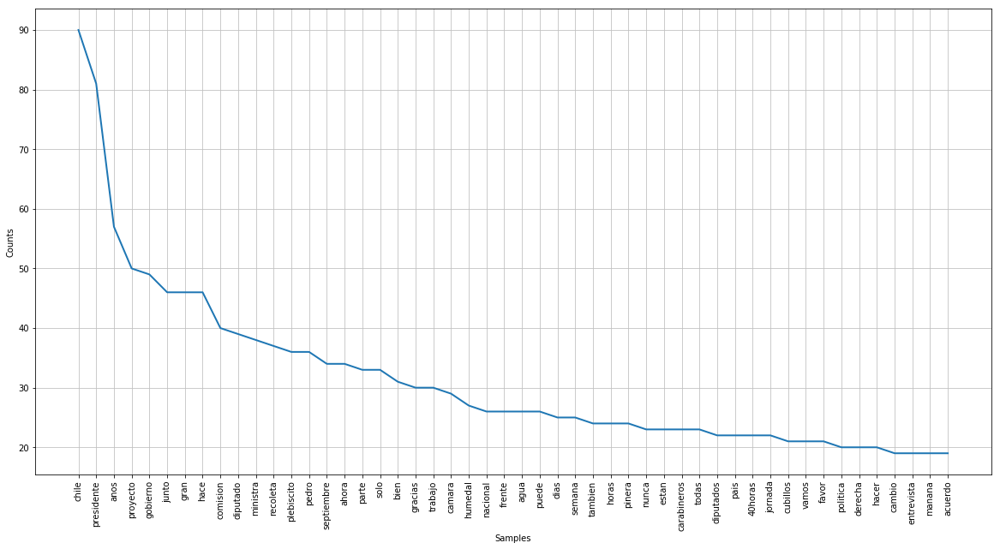

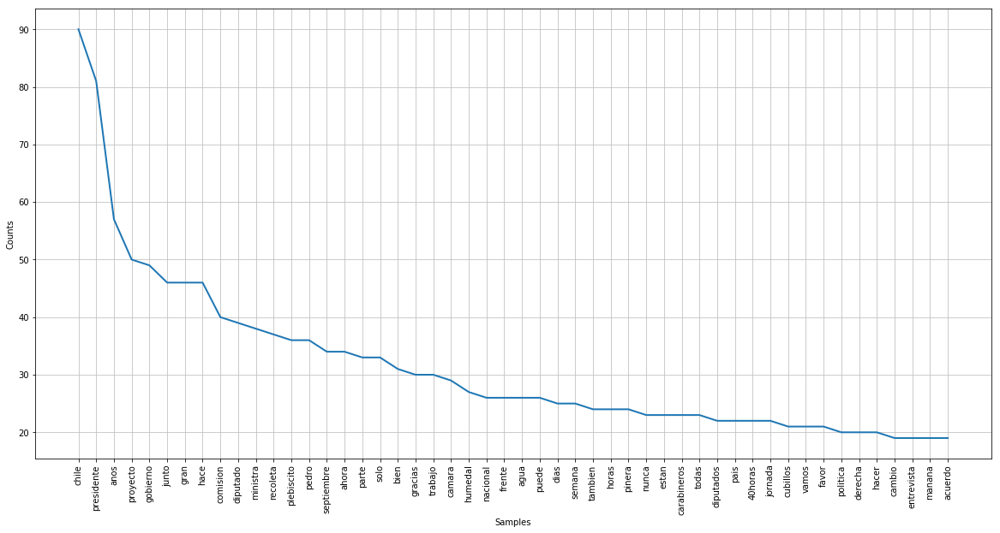

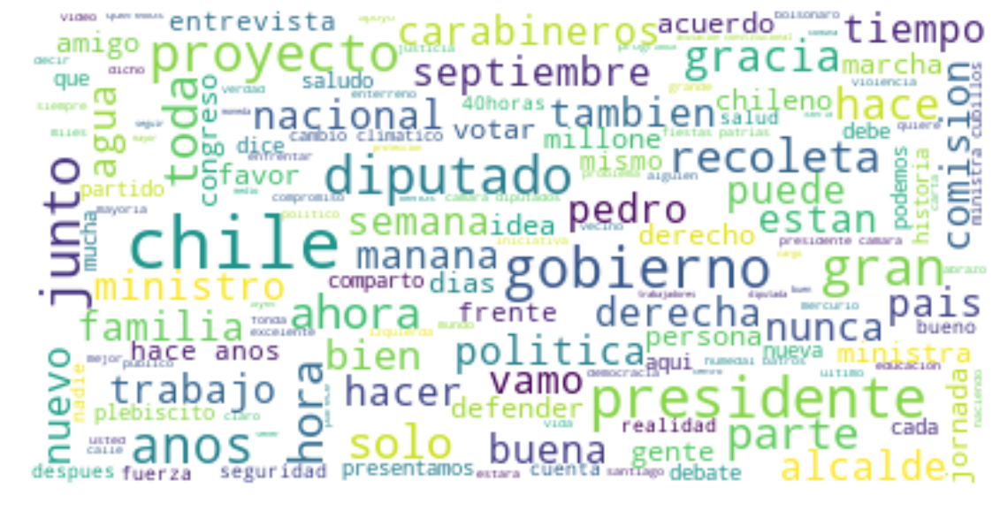

In [27]:
lista_chile_hombres_antes = []
lista_chile_hombres_antes = agregar_tweets_desde_archivo_a_lista("sebastianpinera.json", (2019,9,1), (2019,10, 1), lista_chile_hombres_antes)
lista_chile_hombres_antes = agregar_tweets_desde_archivo_a_lista("joseantoniokast.json", (2019,9,1), (2019,10, 1), lista_chile_hombres_antes)
lista_chile_hombres_antes = agregar_tweets_desde_archivo_a_lista("AlessandriFelip.json", (2019,9,1), (2019,10, 1), lista_chile_hombres_antes)
lista_chile_hombres_antes = agregar_tweets_desde_archivo_a_lista("desbordes.json", (2019,9,1), (2019,10, 1), lista_chile_hombres_antes)

lista_chile_hombres_antes = agregar_tweets_desde_archivo_a_lista("gabrielboric.json", (2019,9,1), (2019,10, 1), lista_chile_hombres_antes)
lista_chile_hombres_antes = agregar_tweets_desde_archivo_a_lista("GiorgioJackson.json", (2019,9,1), (2019,10, 1), lista_chile_hombres_antes)
lista_chile_hombres_antes = agregar_tweets_desde_archivo_a_lista("florcitamotuda.json", (2019,9,1), (2019,10, 1), lista_chile_hombres_antes)
lista_chile_hombres_antes = agregar_tweets_desde_archivo_a_lista("danieljadue.json", (2019,9,1), (2019,10, 1), lista_chile_hombres_antes)
lista_chile_hombres_antes = agregar_tweets_desde_archivo_a_lista("marcoporchile.json", (2019,9,1), (2019,10, 1), lista_chile_hombres_antes)

lista_chile_hombres_antes = agregar_tweets_desde_archivo_a_lista("RicardoLagos.json", (2019,9,1), (2019,10, 1), lista_chile_hombres_antes)
lista_chile_hombres_antes = agregar_tweets_desde_archivo_a_lista("ifloresdiputado.json", (2019,9,1), (2019,10, 1), lista_chile_hombres_antes)
lista_chile_hombres_antes = agregar_tweets_desde_archivo_a_lista("FELIX_GonzalezG.json", (2019,9,1), (2019,10, 1), lista_chile_hombres_antes)
lista_chile_hombres_antes = agregar_tweets_desde_archivo_a_lista("guillier.json", (2019,9,1), (2019,10, 1), lista_chile_hombres_antes)
lista_chile_hombres_antes = agregar_tweets_desde_archivo_a_lista("pepe_auth.json", (2019,9,1), (2019,10, 1), lista_chile_hombres_antes)

tweets_normalizados = normalizar_tweets_desde_lista(lista_chile_hombres_antes)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

plot_freq_dist_palabras(palabras_en_tweets, "todos/freq_dist/hombres_antes.png")
wordcloud_tweets(palabras_en_tweets, "todos/wordcloud/hombres_antes.png")


Tweets agregados. Cantidad de tweets en la lista:  62
Tweets agregados. Cantidad de tweets en la lista:  474
Tweets agregados. Cantidad de tweets en la lista:  580
Tweets agregados. Cantidad de tweets en la lista:  700
Tweets agregados. Cantidad de tweets en la lista:  1387
Tweets agregados. Cantidad de tweets en la lista:  2051
Tweets agregados. Cantidad de tweets en la lista:  2720
Tweets agregados. Cantidad de tweets en la lista:  3334
Tweets agregados. Cantidad de tweets en la lista:  3372
Tweets agregados. Cantidad de tweets en la lista:  3383
Tweets agregados. Cantidad de tweets en la lista:  3489
Tweets agregados. Cantidad de tweets en la lista:  3788
Tweets agregados. Cantidad de tweets en la lista:  3890
Tweets agregados. Cantidad de tweets en la lista:  4098
Tweets normalizados
Tweets tokenizados
<FreqDist with 8485 samples and 30630 outcomes>


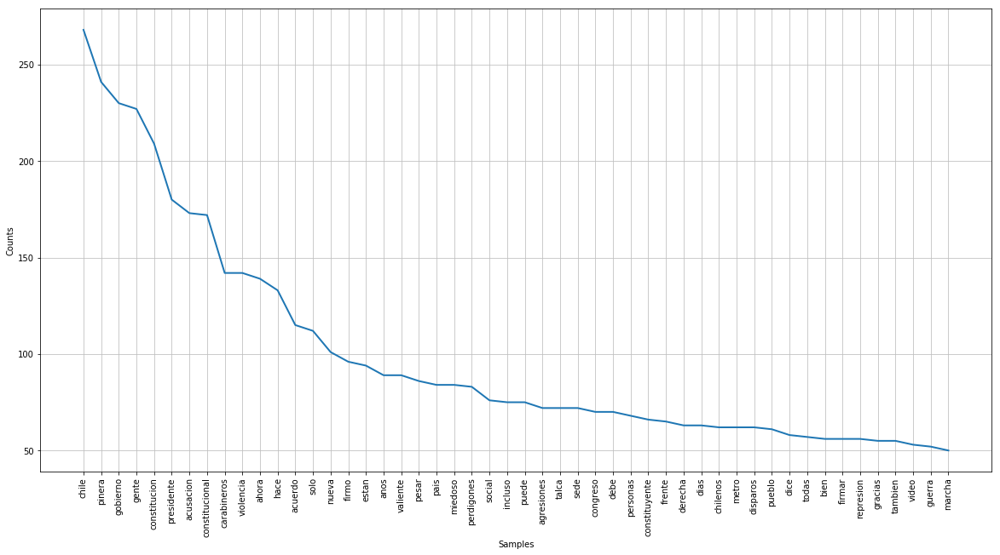

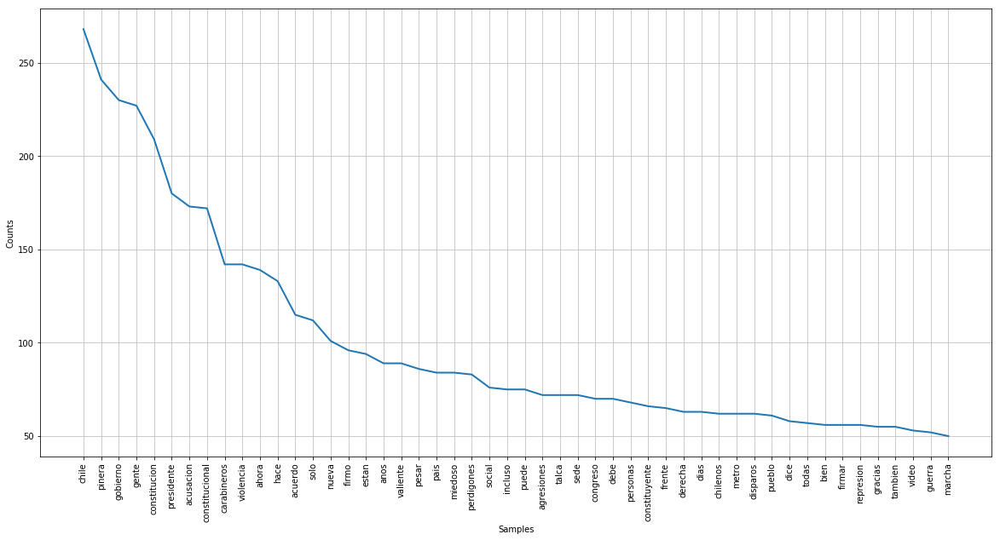

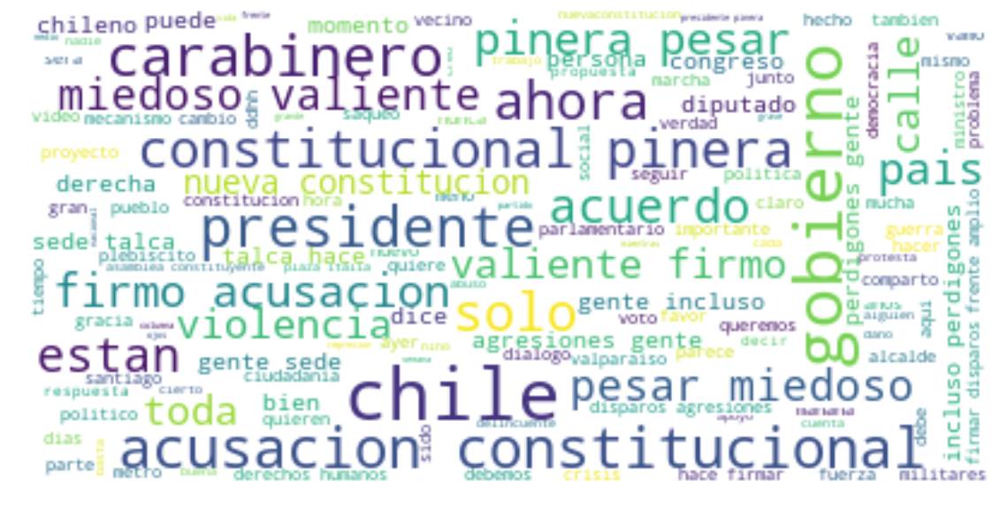

In [31]:
lista_chile_hombres_durante = []
lista_chile_hombres_durante = agregar_tweets_desde_archivo_a_lista("sebastianpinera.json", (2019,10,18), (2019,11, 18), lista_chile_hombres_durante)
lista_chile_hombres_durante = agregar_tweets_desde_archivo_a_lista("joseantoniokast.json", (2019,10,18), (2019,11, 18), lista_chile_hombres_durante)
lista_chile_hombres_durante = agregar_tweets_desde_archivo_a_lista("AlessandriFelip.json", (2019,10,18), (2019,11, 18), lista_chile_hombres_durante)
lista_chile_hombres_durante = agregar_tweets_desde_archivo_a_lista("desbordes.json", (2019,10,18), (2019,11, 18), lista_chile_hombres_durante)

lista_chile_hombres_durante = agregar_tweets_desde_archivo_a_lista("gabrielboric.json", (2019,10,18), (2019,11, 18), lista_chile_hombres_durante)
lista_chile_hombres_durante = agregar_tweets_desde_archivo_a_lista("GiorgioJackson.json", (2019,10,18), (2019,11, 18), lista_chile_hombres_durante)
lista_chile_hombres_durante = agregar_tweets_desde_archivo_a_lista("florcitamotuda.json", (2019,10,18), (2019,11, 18), lista_chile_hombres_durante)
lista_chile_hombres_durante = agregar_tweets_desde_archivo_a_lista("danieljadue.json", (2019,10,18), (2019,11, 18), lista_chile_hombres_durante)
lista_chile_hombres_durante = agregar_tweets_desde_archivo_a_lista("marcoporchile.json", (2019,10,18), (2019,11, 18), lista_chile_hombres_durante)

lista_chile_hombres_durante = agregar_tweets_desde_archivo_a_lista("RicardoLagos.json", (2019,10,18), (2019,11, 18), lista_chile_hombres_durante)
lista_chile_hombres_durante = agregar_tweets_desde_archivo_a_lista("ifloresdiputado.json", (2019,10,18), (2019,11, 18), lista_chile_hombres_durante)
lista_chile_hombres_durante = agregar_tweets_desde_archivo_a_lista("FELIX_GonzalezG.json", (2019,10,18), (2019,11, 18), lista_chile_hombres_durante)
lista_chile_hombres_durante = agregar_tweets_desde_archivo_a_lista("guillier.json", (2019,10,18), (2019,11, 18), lista_chile_hombres_durante)
lista_chile_hombres_durante = agregar_tweets_desde_archivo_a_lista("pepe_auth.json", (2019,10,18), (2019,11, 18), lista_chile_hombres_durante)

tweets_normalizados = normalizar_tweets_desde_lista(lista_chile_hombres_durante)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

plot_freq_dist_palabras(palabras_en_tweets, "todos/freq_dist/hombres_durante.png")
wordcloud_tweets(palabras_en_tweets, "todos/wordcloud/hombres_durante.png")


Tweets agregados. Cantidad de tweets en la lista:  87
Tweets agregados. Cantidad de tweets en la lista:  686
Tweets agregados. Cantidad de tweets en la lista:  867
Tweets agregados. Cantidad de tweets en la lista:  1029
Tweets agregados. Cantidad de tweets en la lista:  2383
Tweets agregados. Cantidad de tweets en la lista:  3458
Tweets agregados. Cantidad de tweets en la lista:  3747
Tweets agregados. Cantidad de tweets en la lista:  4246
Tweets agregados. Cantidad de tweets en la lista:  4431
Tweets agregados. Cantidad de tweets en la lista:  4448
Tweets agregados. Cantidad de tweets en la lista:  4675
Tweets agregados. Cantidad de tweets en la lista:  5340
Tweets agregados. Cantidad de tweets en la lista:  5468
Tweets agregados. Cantidad de tweets en la lista:  5841
Tweets normalizados
Tweets tokenizados
<FreqDist with 11335 samples and 42921 outcomes>


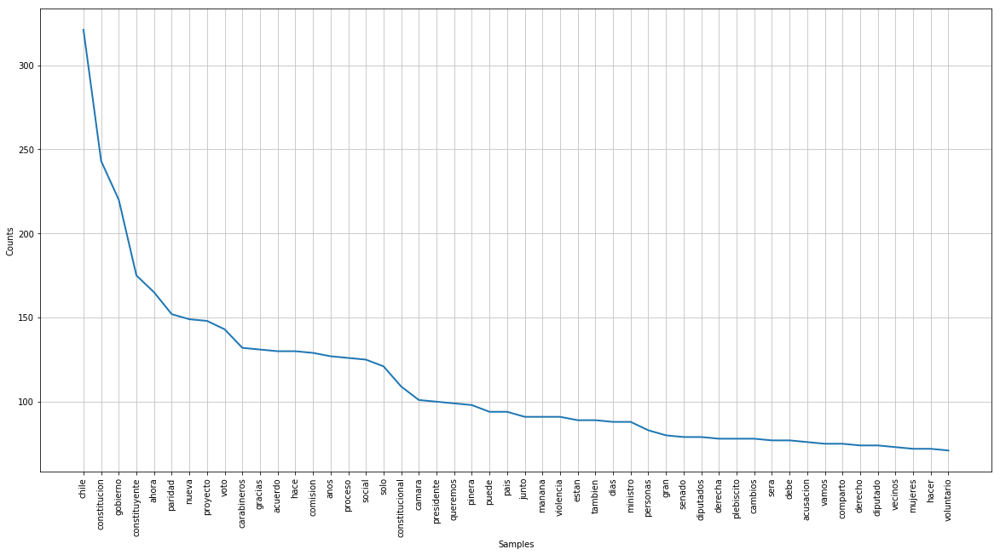

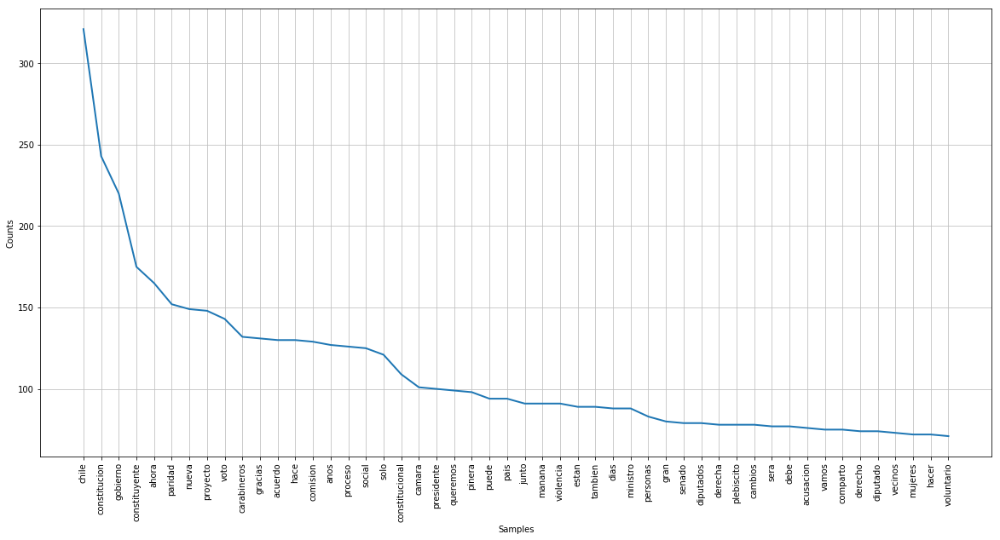

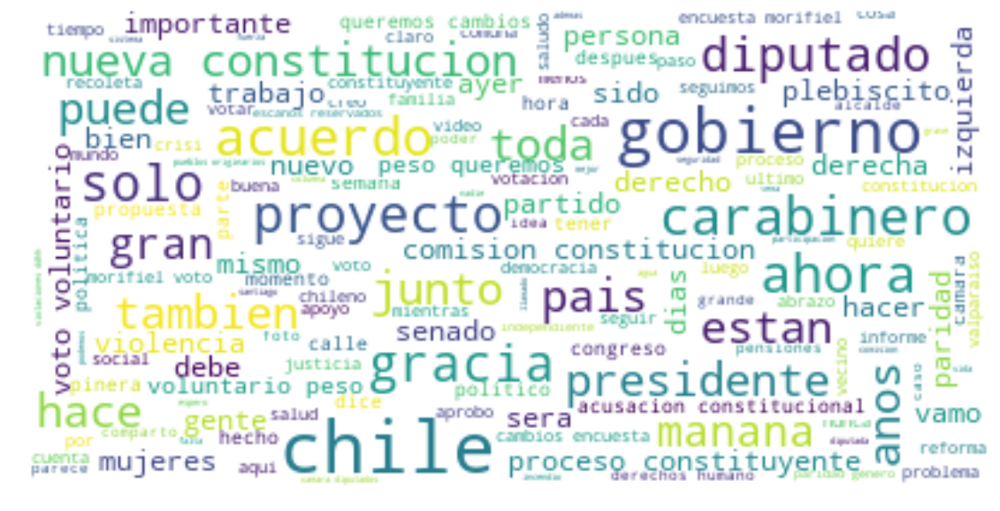

In [30]:
lista_chile_hombres_despues = []
lista_chile_hombres_despues = agregar_tweets_desde_archivo_a_lista("sebastianpinera.json", (2019,11,19), (2020,11, 18), lista_chile_hombres_despues)
lista_chile_hombres_despues = agregar_tweets_desde_archivo_a_lista("joseantoniokast.json", (2019,11,19), (2020,11, 18), lista_chile_hombres_despues)
lista_chile_hombres_despues = agregar_tweets_desde_archivo_a_lista("AlessandriFelip.json", (2019,11,19), (2020,11, 18), lista_chile_hombres_despues)
lista_chile_hombres_despues = agregar_tweets_desde_archivo_a_lista("desbordes.json", (2019,11,19), (2020,11, 18), lista_chile_hombres_despues)

lista_chile_hombres_despues = agregar_tweets_desde_archivo_a_lista("gabrielboric.json", (2019,11,18), (2020,11,18), lista_chile_hombres_despues)
lista_chile_hombres_despues = agregar_tweets_desde_archivo_a_lista("GiorgioJackson.json", (2019,11,18), (2020,11,18), lista_chile_hombres_despues)
lista_chile_hombres_despues = agregar_tweets_desde_archivo_a_lista("florcitamotuda.json", (2019,11,18), (2020,11,18), lista_chile_hombres_despues)
lista_chile_hombres_despues = agregar_tweets_desde_archivo_a_lista("danieljadue.json", (2019,11,18), (2020,11,18), lista_chile_hombres_despues)
lista_chile_hombres_despues = agregar_tweets_desde_archivo_a_lista("marcoporchile.json", (2019,11,18), (2020,11,18), lista_chile_hombres_despues)

lista_chile_hombres_despues = agregar_tweets_desde_archivo_a_lista("RicardoLagos.json", (2019,11,18), (2020,11, 18), lista_chile_hombres_despues)
lista_chile_hombres_despues = agregar_tweets_desde_archivo_a_lista("ifloresdiputado.json", (2019,11,18), (2020,11, 18), lista_chile_hombres_despues)
lista_chile_hombres_despues = agregar_tweets_desde_archivo_a_lista("FELIX_GonzalezG.json", (2019,11,18), (2020,11, 18), lista_chile_hombres_despues)
lista_chile_hombres_despues = agregar_tweets_desde_archivo_a_lista("guillier.json", (2019,11,18), (2020,11, 18), lista_chile_hombres_despues)
lista_chile_hombres_despues = agregar_tweets_desde_archivo_a_lista("pepe_auth.json", (2019,11,18), (2020,11, 18), lista_chile_hombres_despues)

tweets_normalizados = normalizar_tweets_desde_lista(lista_chile_hombres_despues)
palabras_en_tweets = tokenizar_tweets(tweets_normalizados)

plot_freq_dist_palabras(palabras_en_tweets, "todos/freq_dist/hombres_despues.png")
wordcloud_tweets(palabras_en_tweets, "todos/wordcloud/hombres_despues.png")
